Perform EDA on a set of influencers based on their category, no. of followers and no. of posts

In [2]:
import pandas as pd
import regex as re
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
influencer_data = pd.read_csv('/Volumes/Untitled/influencer_data.csv')

In [4]:
influencer_data.set_index('Username',inplace=True)

In [5]:
influencer_data

,Category,#Followers,#Followees,#Posts
Username,,,,
makeupbynvs,beauty,1432.0,1089.0,363.0
jaquelinevandoski,beauty,137600.0,548.0,569.0
anisaartistry,beauty,64644.0,289.0,391.0
rubina_muartistry,beauty,496406.0,742.0,887.0
beautyxabbi,beauty,2050.0,1423.0,751.0
...,...,...,...,...
alingzhang,other,4597.0,881.0,365.0
flower.jini,other,27093.0,1599.0,664.0
ester_starling,other,20621.0,23.0,783.0


In [6]:
#clean data for category Fashion
influencer_data['Category'] = influencer_data['Category'].replace({'fasion': 'fashion', 'fashion 0.5':'fashion'})

<AxesSubplot:>

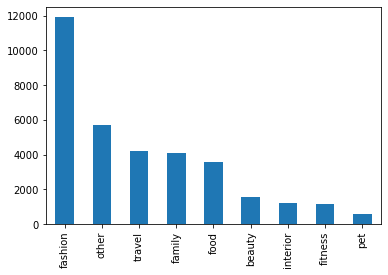

In [7]:
influencer_data['Category'].value_counts().plot(kind='bar')

We will work with only 5 biggest categories: Fashion, Travel, Family, Food and Beauty

In [8]:
search = ['fashion', 'travel', 'family', 'food', 'beauty'] 

In [9]:
influencer_data = influencer_data[influencer_data.isin({'Category': search})['Category']==True]

In [10]:
#Extract names of influencers included in categories
len(influencer_data.index.tolist())

25300

Mega-influencers with more than a million followers (think celebrities) <br>
Macro-influencers with 500K to 1 million followers <br>
Mid-tier influencers with 50K to 500K followers <br>
Micro-influencers with 10K to 50K followers <br>
Nano-influencers with 1K to 10K followers <br>

In [11]:
# create a list of our conditions
conditions = [
    (influencer_data['#Followers'] <= 1000),
    (influencer_data['#Followers'] > 1000) & (influencer_data['#Followers'] <= 10000),
    (influencer_data['#Followers'] > 10000) & (influencer_data['#Followers'] <= 50000),
    (influencer_data['#Followers'] > 50000) & (influencer_data['#Followers'] <= 500000),
    (influencer_data['#Followers'] > 500000) & (influencer_data['#Followers'] <= 1000000),
    (influencer_data['#Followers'] > 1000000)
    ]

In [12]:
# create a list of the values we want to assign for each condition
values = ['NA', 'Nano', 'Micro', 'Mid-tier','Macro','Mega']

In [13]:
# create a new column and use np.select to assign values to it using our lists as arguments
influencer_data.loc[:,'tier'] = np.select(conditions, values)

/opt/anaconda3/envs/nlp21v0/lib/python3.8/site-packages/pandas/core/indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
/opt/anaconda3/envs/nlp21v0/lib/python3.8/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [14]:
influencer_data

,Category,#Followers,#Followees,#Posts,tier
Username,,,,,
makeupbynvs,beauty,1432.0,1089.0,363.0,Nano
jaquelinevandoski,beauty,137600.0,548.0,569.0,Mid-tier
anisaartistry,beauty,64644.0,289.0,391.0,Mid-tier
rubina_muartistry,beauty,496406.0,742.0,887.0,Mid-tier
beautyxabbi,beauty,2050.0,1423.0,751.0,Nano
...,...,...,...,...,...
_su_luv_,travel,41388.0,5279.0,318.0,Micro
zacharytelliott,travel,14534.0,219.0,3470.0,Micro
marie_abhg,travel,6048.0,336.0,410.0,Nano


<AxesSubplot:>

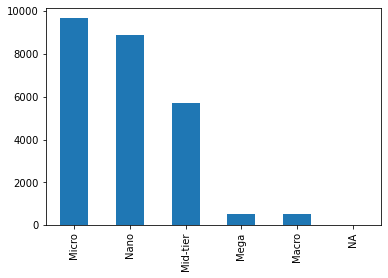

In [15]:
influencer_data['tier'].value_counts().plot(kind='bar')

In [16]:
#Export the new set of influencer data
#influencer_data.to_csv('/Users/lamga/OneDrive/IOD Lessons/Projects/Extract IG influencer dataset/influencer_data_rev.csv',index=True, header=True)

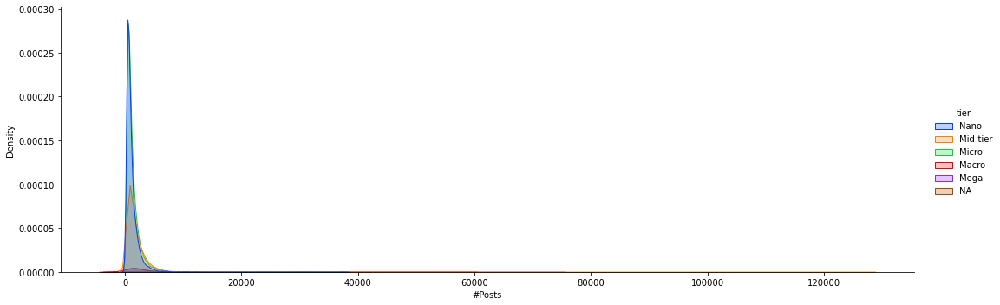

In [17]:
#Distribution of no of post
ax = sns.displot(data=influencer_data, x='#Posts', hue='tier', kind='kde', fill=True, palette=sns.color_palette('bright')[:6], height=5, aspect=3)

In [18]:
# We will work with 100 latest posts from each influencer - which is the min no.
influencer_data.describe()

,#Followers,#Followees,#Posts
count,2.530000e+04,25300.000000,25300.000000
mean,1.355248e+05,1498.385455,1378.387549
std,1.213223e+06,1503.984094,1853.623196
min,1.000000e+03,0.000000,100.000000
25%,5.723750e+03,579.000000,528.000000
50%,1.711600e+04,977.000000,911.000000
75%,5.494975e+04,1797.000000,1654.000000
max,9.647601e+07,8392.000000,127520.000000


### Look at the sample dataset

In [19]:
dfs10_en = pd.read_csv('/Users/lamga/OneDrive/IOD Lessons/Projects/Extract IG influencer dataset/dfs10enc.csv')

In [20]:
dfs10_user = pd.read_csv('/Users/lamga/OneDrive/IOD Lessons/Projects/Extract IG influencer dataset/dfs10user.csv')

<AxesSubplot:>

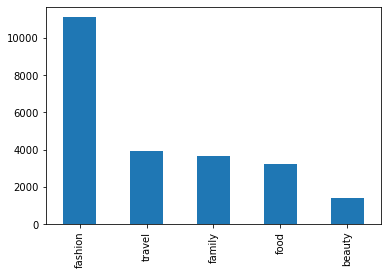

In [21]:
#imbalanced dataset noted
dfs10_user['Category'].value_counts().plot(kind='bar')

<AxesSubplot:ylabel='Category'>

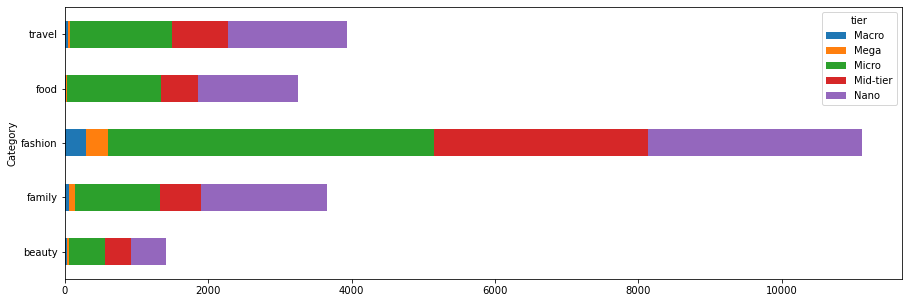

In [22]:
dfs10_user.groupby('Category')['tier'].value_counts().unstack(level=1).plot(kind='barh',figsize=(15,5),stacked=True)

In [23]:
dfs10_user.head()

,influencer,captions,tokens,no_hashtag,hashtag,Category,tier
0,00s_supermodels,#FashionEditorial Scan By Me #IngaSavits for E...,fashioneditorial scan by me ingasavits for ell...,#FashionEditorial Scan By Me #IngaSavits for E...,#FashionEditorial #IngaSavits #ELLE #magazine ...,fashion,Nano
1,0720_b,# # # # # Eternal Beauty # # # estinaofficial...,eternal beauty estinaofficial rosemont santama...,# # # # # Eternal Beauty # # # estinaofficial...,#ROSEMONT #santamarianovella #bodylotion #body...,fashion,Micro
2,0821_me,X 30 httpwwwwemakepricecomdealadeal4079242 # ...,x 30 httpwwwwemakepricecomdealadeal4079242 ad ...,X 30 httpwwwwemakepricecomdealadeal4079242 # ...,#AD #ORT #oxfordreadingtree #Hmall #1 #EM #EM ...,food,Mid-tier
3,1000manerasdevestir,Vamos a por esta mini semana estrenando total ...,vamos a por esta mini semana estrenando total ...,Vamos a por esta mini semana estrenando total ...,#fashionblogger #1000manerasdevestir #adagatti...,fashion,Micro
4,100pintas,Mais um mood natalcio #coolkids #fashionkids #...,mais um mood natalcio coolkids fashionkids por...,Mais um mood natalcio #coolkids #fashionkids #...,#coolkids #fashionkids #portuguesebrands #kids...,family,Nano


In [24]:
dfs10_en.columns

Index(['influencer', 'posts', 'image', 'contents', 'captions',
       'comment_counts', 'comments', 'likes', 'count_tags', 'verified_tags',
       'en_score', 'tokens', 'no_hashtag', 'hashtag', 'tokens_tagged', 'tags',
       'tags_GPE', 'tags_EVENT', 'tags_FAC', 'tags_NORP', 'tags_WORK_OF_ART',
       'tags_ORG', 'tags_PERSON', 'tags_LOC', 'tags_PRODUCT', 'sentiment',
       'cat_prob', 'influencer_cat', 'beauty', 'family', 'fashion', 'food',
       'travel', 'engagement_rate', 'tier'],
      dtype='object')

#### Additional Feature Engineering

In [26]:
#Create tier for influencers based on no of followers
dfs10_en['tier_num'] = dfs10_en['tier'].map(dict(zip(values,range(6))))

In [29]:
#No of images posted
dfs10_en['count_image']=dfs10_en['image'].apply(len)

In [38]:
#Transform tokens to scalar to use words as features

#Transform to lower case
import string
dfs10_en['tokens'] = dfs10_en['tokens'].str.lower()
#Remove punctuation
table = str.maketrans('', '', string.punctuation)
dfs10_en['tokens'] = [dfs10_en['tokens'][row].translate(table) for row in range(len(dfs10_en['tokens']))]
#Remove stopwords
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop = stopwords.words('english')
dfs10_en['tokens'] = dfs10_en['tokens'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))

[nltk_data] Downloading package stopwords to /Users/lamga/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [41]:
#create additional features
dfs10_en['wordcount']=dfs10_en['tokens'].str.split().apply(len)

In [52]:
pd.Series(' '.join(dfs10_en['tokens']).split()).value_counts().iloc[:1000]

love           33067
day            30406
wa             29452
im             29095
one            25695
               ...  
pack             811
finding          811
comfortable      811
secret           811
unique           811
Length: 1000, dtype: int64

In [65]:
freq_d.index

Index(['love', 'day', 'wa', 'im', 'one', 'like', 'time', 'get', 'new', 'happy',
       ...
       'longer', 'safe', 'cookie', 'mascara', 'finish', 'pack', 'finding',
       'comfortable', 'secret', 'unique'],
      dtype='object', length=1000)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

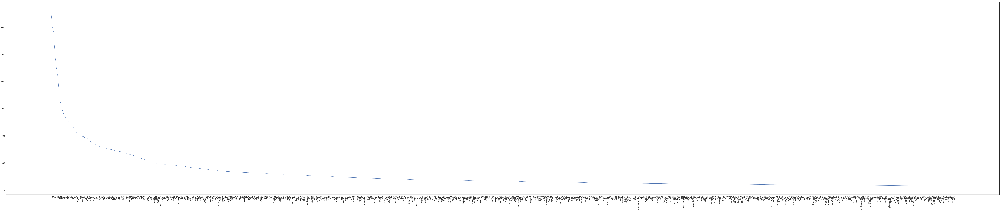

In [119]:
#Find words spreading (each word frequency)
freq_d = pd.Series(' '.join(dfs10_en['tokens']).split()).value_counts().iloc[:1000]
#Plot the words distribution
ax1 = freq_d.plot(kind='line', ax=None, figsize=(200,40), use_index=True,
            title='Word Frequency', grid=None, legend=False, style=None,
            logx=False, logy=False, loglog=False, xticks=None,
            yticks=None, xlim=None, ylim=None, rot=None,
            fontsize=18, colormap=None, table=False, yerr=None,
            xerr=None, label=None, secondary_y=False)
ax1.set_xticks(np.arange(1000));
ax1.set_xticklabels(freq_d.index);
plt.xticks(rotation=90)

In [122]:
freq_d = pd.Series(' '.join(dfs10_en['tokens']).split()).value_counts()

In [123]:
len(freq_d[freq_d>=15000]) #remove frequencies above 15k

13

In [127]:
len(freq_d[freq_d>=1000]) #remove frequencies below 1k

833

In [129]:
#Remove the least frequent words
rare_d = pd.Series(' '.join(dfs10_en['tokens']).split()).value_counts()[-833:]
rare_d = list(rare_d.index)
dfs10_en['tokens'] = dfs10_en['tokens'].apply(lambda x: " ".join(x for x in x.split() if x not in rare_d))
#Remove the most frequent words
freq_d = pd.Series(' '.join(dfs10_en['tokens']).split()).value_counts()[:13]
freq_d = list(freq_d.index)
dfs10_en['tokens'] = dfs10_en['tokens'].apply(lambda x: " ".join(x for x in x.split() if x not in freq_d))

In [130]:
dfs10_en['tokens'] = [text.split() for text in dfs10_en['tokens']]

In [131]:
#Create a set of text records for each field
from gensim import corpora
dict_d = corpora.Dictionary(dfs10_en['tokens'])

/opt/anaconda3/envs/nlp21v0/lib/python3.8/site-packages/gensim/similarities/__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [132]:
#Convert tokenized text (corpora) to vectors
corpus_d = [dict_d.doc2bow(line) for line in dfs10_en['tokens']]

In [134]:
#Transform vectors of texts to scalar values (calculating norms of vectors)
from numpy import linalg as LA
corpus_d_vec_norm = [LA.norm(vec) for vec in corpus_d]
#Replace text descriptions in the database with norms of vectors
dfs10_en['tokens'] = corpus_d_vec_norm

In [137]:
dfs10_en.columns

Index(['influencer', 'posts', 'image', 'contents', 'captions',
       'comment_counts', 'comments', 'likes', 'count_tags', 'verified_tags',
       'en_score', 'tokens', 'no_hashtag', 'hashtag', 'tokens_tagged', 'tags',
       'tags_GPE', 'tags_EVENT', 'tags_FAC', 'tags_NORP', 'tags_WORK_OF_ART',
       'tags_ORG', 'tags_PERSON', 'tags_LOC', 'tags_PRODUCT', 'sentiment',
       'cat_prob', 'influencer_cat', 'beauty', 'family', 'fashion', 'food',
       'travel', 'engagement_rate', 'tier', 'wordcount', 'tier_num',
       'count_image'],
      dtype='object')

<AxesSubplot:>

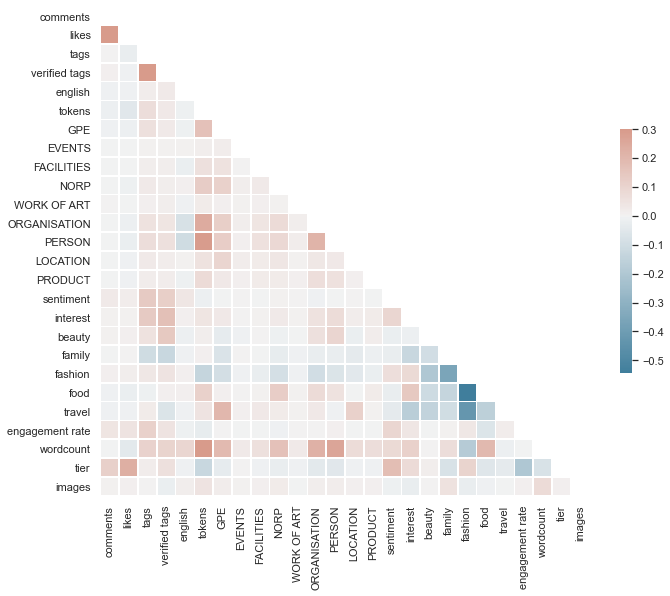

In [349]:
columns = [
       'comments', 'likes', 'tags', 'verified tags',
       'english', 'tokens',
       'GPE', 'EVENTS', 'FACILITIES', 'NORP', 'WORK OF ART',
       'ORGANISATION', 'PERSON', 'LOCATION', 'PRODUCT', 'sentiment',
       'interest', 'beauty', 'family', 'fashion', 'food',
       'travel', 'engagement rate','wordcount','tier', 'images']

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="white")

# Compute the correlation matrix
corr = dfs10_en.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, xticklabels=columns, yticklabels=columns,
            mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

<AxesSubplot:ylabel='Frequency'>

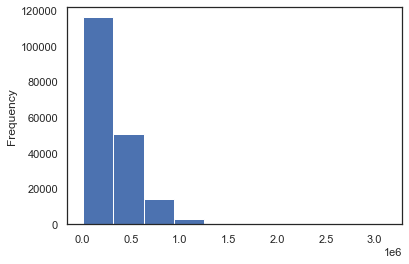

In [209]:
#Check distribution of selected features - skewness detected - to consider boxcox
#dfs10_en['tokens'].plot(kind='hist')

<AxesSubplot:ylabel='Frequency'>

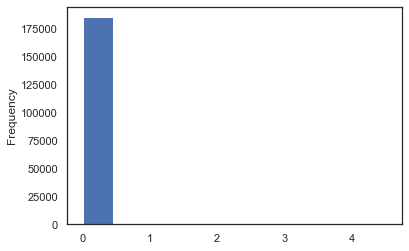

In [660]:
dfs10_en['engagement_rate'].plot(kind='hist')

In [204]:
dfs10_en.columns

Index(['influencer', 'posts', 'image', 'contents', 'captions',
       'comment_counts', 'comments', 'likes', 'count_tags', 'verified_tags',
       'en_score', 'tokens', 'no_hashtag', 'hashtag', 'tokens_tagged', 'tags',
       'tags_GPE', 'tags_EVENT', 'tags_FAC', 'tags_NORP', 'tags_WORK_OF_ART',
       'tags_ORG', 'tags_PERSON', 'tags_LOC', 'tags_PRODUCT', 'sentiment',
       'cat_prob', 'influencer_cat', 'beauty', 'family', 'fashion', 'food',
       'travel', 'engagement_rate', 'tier', 'wordcount', 'tier_num'],
      dtype='object')

### Look at target variable

In [140]:
#visualise distribution of target (after log transformation)
target = dfs10_en[dfs10_en['engagement_rate']>0]
target.loc[:,'engagement_rate_normalised'] = target.loc[:,'engagement_rate'].apply(np.log)

/opt/anaconda3/envs/nlp21v0/lib/python3.8/site-packages/pandas/core/indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
/opt/anaconda3/envs/nlp21v0/lib/python3.8/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


<AxesSubplot:xlabel='engagement_rate', ylabel='Density'>

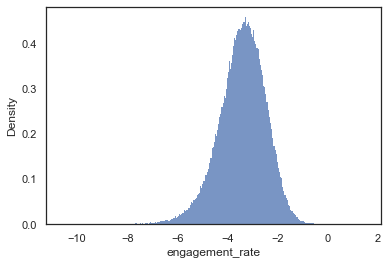

In [141]:
sns.histplot(np.log(target.engagement_rate),kde=False, stat="density", linewidth=0)

<AxesSubplot:xlabel='engagement_rate', ylabel='Count'>

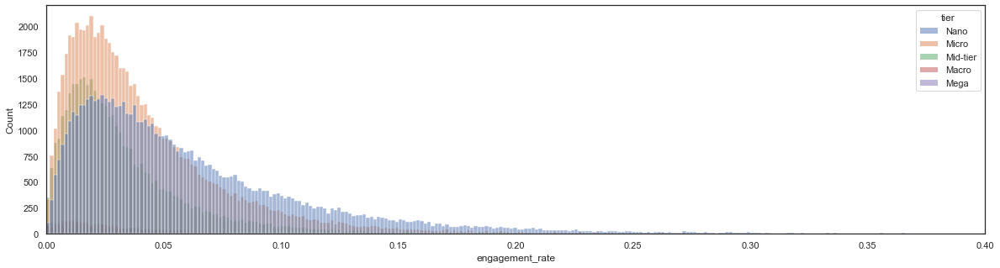

In [667]:
plt.figure(figsize=(20,5))
plt.xlim(0,0.4)
sns.histplot(data=dfs10_en,x='engagement_rate',hue='tier'
             #,kde=False, stat="density", linewidth=0
            )

In [142]:
dict(zip(values[1:6],range(5)))

{'Nano': 0, 'Micro': 1, 'Mid-tier': 2, 'Macro': 3, 'Mega': 4}

In [143]:
target.loc[:,'tier_numeric']=target.loc[:,'tier'].map(dict(zip(values[1:6],range(5))))

/opt/anaconda3/envs/nlp21v0/lib/python3.8/site-packages/pandas/core/indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
/opt/anaconda3/envs/nlp21v0/lib/python3.8/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


Text(0.5, 1.0, '')

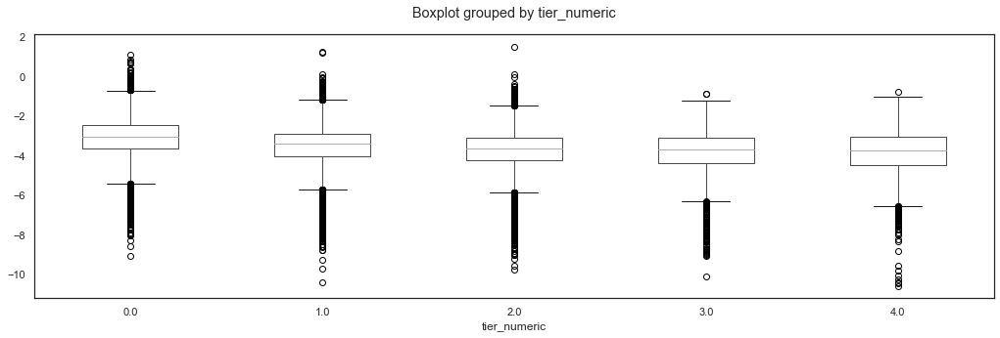

In [144]:
boxplot = target.boxplot(column=['engagement_rate_normalised'], by='tier_numeric',grid=False, figsize=(17,5))
boxplot.set_title("")

### Explore TOP words and tags

In [23]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [24]:
#trial
list=['#FashionEditorial', '#IngaSavits', '#ELLE']
re.sub('#','',' '.join(tags for tags in list))

'FashionEditorial IngaSavits ELLE'

In [25]:
import matplotlib.pyplot as plt

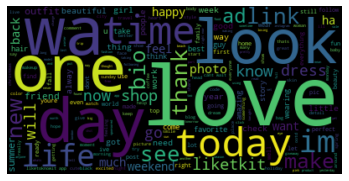

In [26]:
#Trial
text = " ".join(tokens for tokens in dfs10_user[dfs10_user['Category']=='fashion']['tokens'])
wordcloud = WordCloud().generate(text)
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [27]:
def plot_wordcloud(corpus, max_words=150, max_font_size=35, figsize=(10,5)):
    text = " ".join(x for x in corpus) #e.g. dfs10_user[dfs10_user['Category']=='fashion']['tokens']
    wordcloud = WordCloud(max_font_size=max_font_size, max_words=max_words, background_color="white").generate(text)
    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

In [28]:
import re

In [68]:
#Trial
text=dfs10_user[dfs10_user['Category']==cat]['hashtag'].iloc[1]
text

'#ROSEMONT #santamarianovella #bodylotion #bodywash #AD #sponsored #CococapitanxJillstuartnewyork #cocoswift #jillstuartsport'

In [69]:
#Trial
re.sub('#','',text)

'ROSEMONT santamarianovella bodylotion bodywash AD sponsored CococapitanxJillstuartnewyork cocoswift jillstuartsport'

In [78]:
#dfs10_user[dfs10_user['Category']==cat]['hashtag'].apply(str).apply(lambda x: re.sub('#','',x))

# fashion:


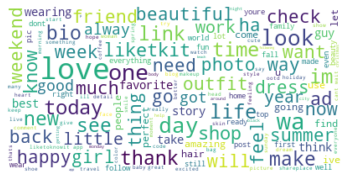

# food:


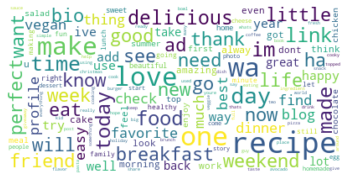

# family:


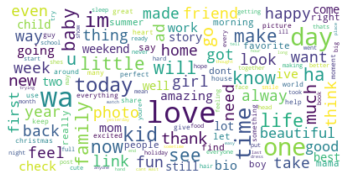

# beauty:


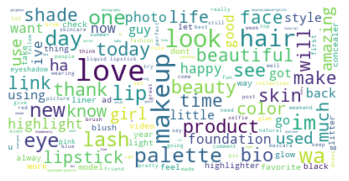

# travel:


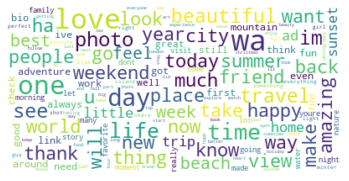

In [46]:
for cat in dfs10_user["Category"].unique():
    print("# {}:".format(cat))
    corpus = dfs10_user[dfs10_user['Category']==cat]['tokens']
    plot_wordcloud(corpus, max_words=150, max_font_size=35, figsize=(10,5))

# fashion:


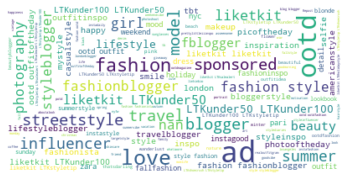

# food:


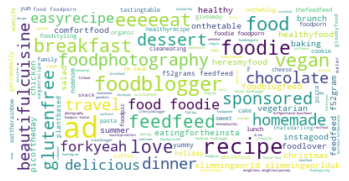

# family:


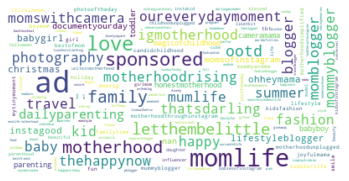

# beauty:


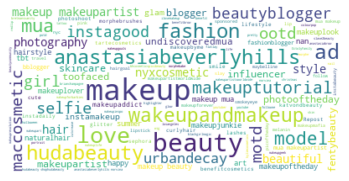

# travel:


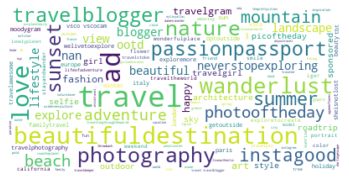

In [79]:
for cat in dfs10_user["Category"].unique():
    print("# {}:".format(cat))
    corpus = dfs10_user[dfs10_user['Category']==cat]['hashtag'].apply(str).apply(lambda x: re.sub('#','',x))
    plot_wordcloud(corpus, max_words=150, max_font_size=35, figsize=(10,5))

### Predicting engagement rate - feature selection

In [227]:
dfs10_en['influencer'].nunique()

23374

In [226]:
dfs10_en.tail()

,influencer,posts,image,contents,captions,comment_counts,comments,likes,count_tags,verified_tags,...,beauty,family,fashion,food,travel,engagement_rate,tier,wordcount,tier_num,count_image
184996,zyndl_lala,1753783027169190481.info,['1753783027169190481.jpg'],"{'owner': {'is_unpublished': False, 'username'...",Happy Birthday to ME #birthday #9 #april #me #...,33,alles liebe smiling face with smiling eyes her...,426,4,3,...,0.024501,0.550225,0.304037,0.031626,0.089611,0.110736,Nano,23,1.0,27
184997,zyndl_lala,1821632628576354559.info,['1821632628576354559.jpg'],"{'viewer_has_saved_to_collection': False, 'has...",authentic humaneness #kissesforagreatperson #g...,9,smiling face with hearteyessmiling face with h...,340,1,0,...,0.032532,0.096816,0.666089,0.122359,0.082204,0.084198,Nano,18,1.0,27
184998,zyndl_lala,1696346693367657579.info,['1696346693367657579.jpg'],"{'taken_at_timestamp': 1516440305, 'owner': {'...",H A P P Y W E E K E N D #picoftheday #bestofth...,24,smiling cat with hearteyesbeating heart oh wow...,915,3,2,...,0.382981,0.060623,0.330339,0.071311,0.154745,0.226538,Nano,24,1.0,27
184999,zyndl_lala,1978918308767798491.info,['1978918308767798491.jpg'],{'media_preview': 'ACoq6GmNTzTGoAy2nLTZClgnyA+...,A day like any other #routine #happyday #me #l...,5,smiling face with hearteyesindex pointing upme...,669,0,0,...,0.143396,0.127574,0.477317,0.122253,0.129460,0.162606,Nano,7,1.0,27
185000,zyndl_lala,1937599324781268346.info,['1937599324781268346.jpg'],{'tracking_token': 'eyJ2ZXJzaW9uIjo1LCJwYXlsb2...,JUST now #teamselfie #teamfilter,0,NaN,462,0,0,...,0.031708,0.094284,0.690744,0.064665,0.118599,0.111460,Nano,2,1.0,27


In [ ]:
#Pairplot will take significant time
#sns.pairplot(dfs10_en.sample(1000), hue='tier')

In [301]:
#Select features
X = dfs10_en.drop(columns=['influencer','posts','image','contents','captions','comment_counts','comments',
                           'likes','no_hashtag','hashtag','tokens_tagged','tags','engagement_rate','tier', 'influencer_cat'])

In [302]:
X.dropna(inplace=True)

In [303]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 184983 entries, 0 to 185000
Data columns (total 23 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   count_tags        184983 non-null  int64  
 1   verified_tags     184983 non-null  int64  
 2   en_score          184983 non-null  float64
 3   tokens            184983 non-null  float64
 4   tags_GPE          184983 non-null  int64  
 5   tags_EVENT        184983 non-null  int64  
 6   tags_FAC          184983 non-null  int64  
 7   tags_NORP         184983 non-null  int64  
 8   tags_WORK_OF_ART  184983 non-null  int64  
 9   tags_ORG          184983 non-null  int64  
 10  tags_PERSON       184983 non-null  int64  
 11  tags_LOC          184983 non-null  int64  
 12  tags_PRODUCT      184983 non-null  int64  
 13  sentiment         184983 non-null  float64
 14  cat_prob          184983 non-null  float64
 15  beauty            184983 non-null  float64
 16  family            18

In [305]:
index = dfs10_en[dfs10_en['tier_num'].isna()].index.tolist()
y = dfs10_en.drop(index)
y = y['engagement_rate']
index

[103838,
 103839,
 103840,
 103841,
 103842,
 103843,
 103844,
 103845,
 166224,
 166225,
 166226,
 166227,
 166228,
 166229,
 166230,
 166231,
 166232,
 166233]

In [306]:
X.shape

(184983, 23)

In [332]:
y.shape

(184983,)

In [309]:
#from sklearn.preprocessing import StandardScaler
#scaler = StandardScaler()
#X_train_sc = scaler.fit_transform(X_train)
#X_test_sc = scaler.transform(X_test)

In [337]:
from sklearn.preprocessing import MinMaxScaler

mmscaler_x = MinMaxScaler()
mmscaler_y = MinMaxScaler()
X_mm = mmscaler_x.fit_transform(X)
y_mm = mmscaler_y.fit_transform(np.array(y).reshape(-1,1))

In [338]:
X_mm_df.head()

,count_tags,verified_tags,en_score,tokens,tags_GPE,tags_EVENT,tags_FAC,tags_NORP,tags_WORK_OF_ART,tags_ORG,...,sentiment,cat_prob,beauty,family,fashion,food,travel,wordcount,tier_num,count_image
0,0.041667,0.00,0.999994,0.000014,0.0,0.0,0.0,0.0,0.0,0.2,...,0.499875,0.601829,0.061960,0.097648,0.602138,0.073940,0.165015,0.057751,0.0,0.169231
1,0.166667,0.15,0.999995,0.000037,0.0,0.0,0.0,0.0,0.0,0.0,...,0.499875,0.624868,0.200945,0.090412,0.625179,0.010840,0.073465,0.079027,0.0,0.003077
2,0.041667,0.05,0.599997,0.000023,0.0,0.0,0.0,0.0,0.0,0.0,...,0.499875,0.522635,0.061735,0.139456,0.522934,0.101699,0.174961,0.018237,0.0,0.003077
3,0.083333,0.05,0.999992,0.000038,0.0,0.0,0.0,0.0,0.0,0.0,...,0.889122,0.550324,0.133764,0.092481,0.550626,0.051428,0.172447,0.063830,0.0,0.169231
4,0.041667,0.00,0.799998,0.000049,0.0,0.0,0.0,0.0,0.0,0.1,...,0.499875,0.550244,0.136658,0.092467,0.550546,0.038953,0.182123,0.072948,0.0,0.086154


In [381]:
X_mm.shape

(184983, 23)

In [386]:
y_mm = y_mm.reshape(184983,)

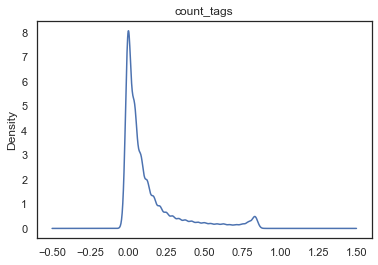

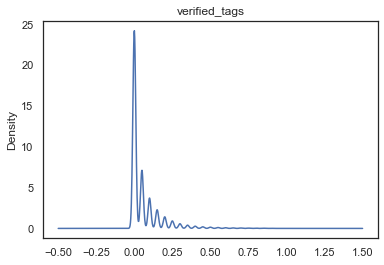

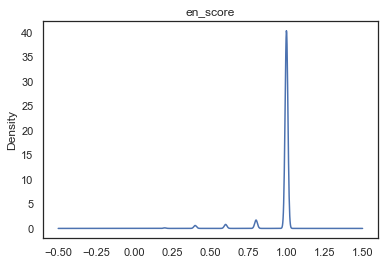

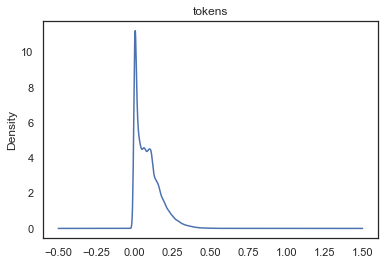

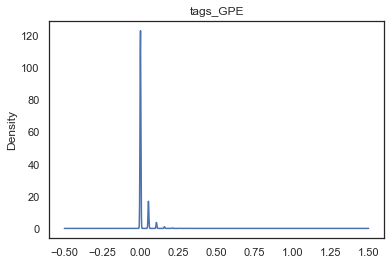

...

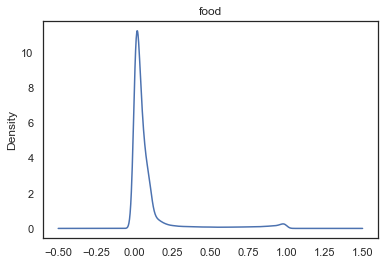

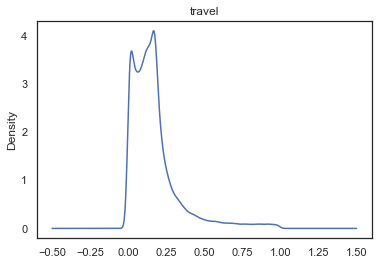

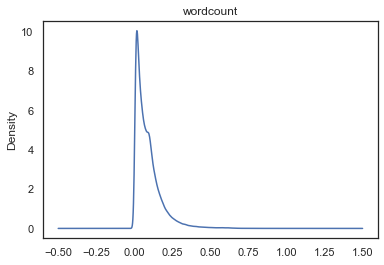

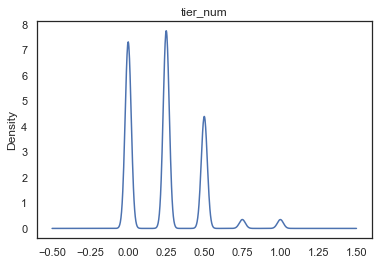

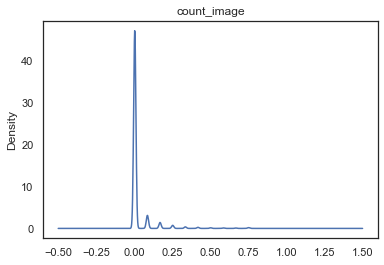

In [387]:
X_mm_df = pd.DataFrame(X_mm, columns= X.columns)
for col in X_mm_df.columns:
    #X_mm_df.pivot(columns='tier_num', values=col).plot(kind='kde')
    X_mm_df[col].plot(kind='kde')
    plt.title(col)
    plt.show()

In [491]:
X.shape[0]

184983

In [502]:
X_bc = pd.DataFrame(index=np.arange(X.shape[0]), columns = X.columns)

In [503]:
X_bc

,count_tags,verified_tags,en_score,tokens,tags_GPE,tags_EVENT,tags_FAC,tags_NORP,tags_WORK_OF_ART,tags_ORG,...,sentiment,cat_prob,beauty,family,fashion,food,travel,wordcount,tier_num,count_image
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184978,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
184979,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
184980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
184981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [504]:
#apply boxcox transformation
from sklearn.preprocessing import PowerTransformer
bc_scaler = PowerTransformer(method = 'box-cox')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

col_names = X.columns.tolist()
X_bc[col_names] = bc_scaler.fit_transform(X.values+1)


In [402]:
#Split train test dataset
from sklearn.model_selection import train_test_split
#X_train_mm, X_test_mm, y_train_mm, y_test_mm = train_test_split(X_mm,y_mm,test_size=0.1, random_state=1)
X_train_mm, X_test_mm, y_train, y_test = train_test_split(X_mm,y,test_size=0.1, random_state=1)

In [505]:
X_train_bc, X_test_bc, y_train, y_test = train_test_split(X_bc,y,test_size=0.1, random_state=1)

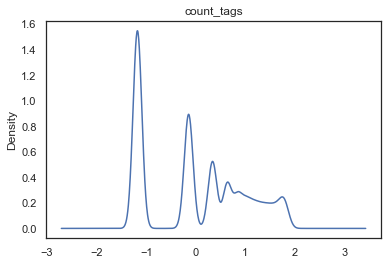

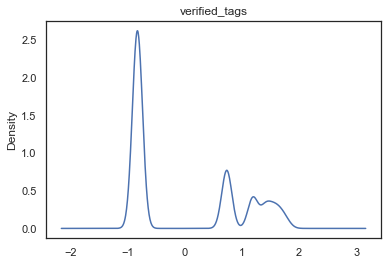

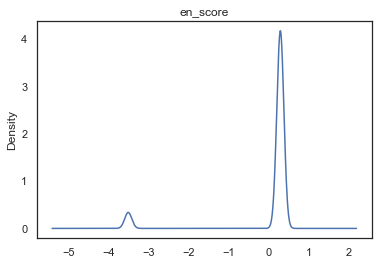

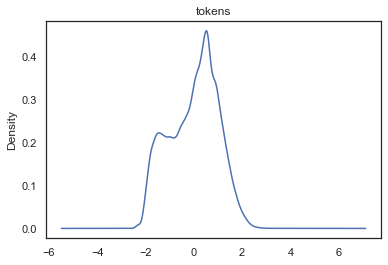

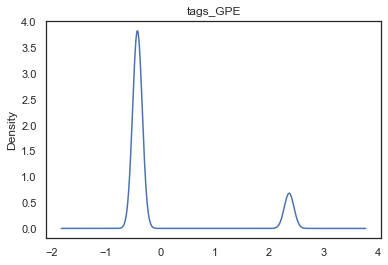

...

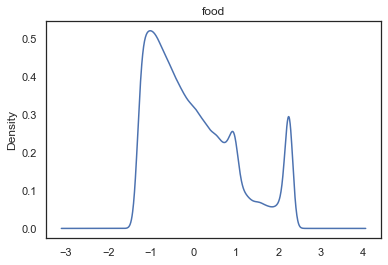

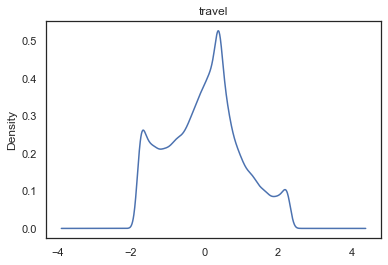

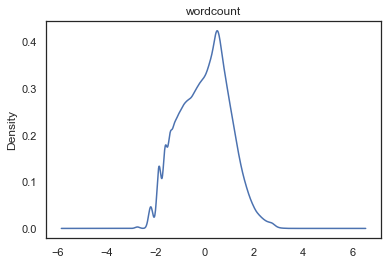

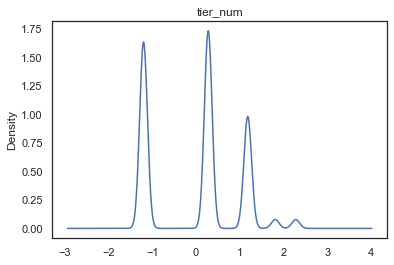

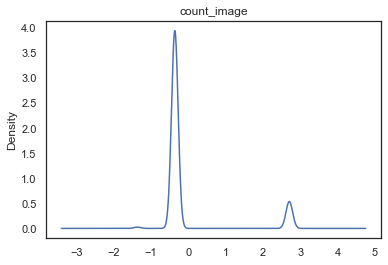

In [566]:
for col in X_bc.columns:
    #X_mm_df.pivot(columns='tier_num', values=col).plot(kind='kde')
    X_bc[col].plot(kind='kde')
    plt.title(col)
    plt.show()

In [403]:
# Create Model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV
lr = LinearRegression()

### Linear Regression

In [404]:
lr.fit(X_train_mm, y_train)

LinearRegression()

In [405]:
# Score: how much of y depends on x
lr.score(X_test_mm, y_test)

0.07138930806216326

In [406]:
# Check Coefficient: in order of how the columns come about
lr.coef_

array([ 3.44216265e-02, -2.33818845e-02, -1.00800452e-02, -3.93891901e-02,
       -8.61612736e-03, -8.78839076e-03, -3.93843913e-03, -9.39370771e-03,
       -6.08269704e-04,  4.22416646e-03,  1.68545453e-02, -7.27611510e-03,
        8.63345928e-04,  3.13035177e-02,  8.31516101e-03, -2.77051681e+03,
       -2.76646490e+03, -2.77268799e+03, -2.77324155e+03, -2.77378129e+03,
       -2.80187368e-03, -5.71864436e-02,  1.10569921e-02])

In [407]:
col_dict = dict(zip(X.columns,['tags','verified tags', 'english', 'tokens', 'GPE', 'EVENTS',
 'FACILITIES', 'NORP', 'WORK OF ART', 'ORGANISATION', 'PERSON', 'LOCATION', 'PRODUCT',
 'sentiment', 'interest', 'beauty', 'family', 'fashion', 'food', 'travel', 'wordcount',
 'tier', 'images']))
col_dict


{'count_tags': 'tags',
 'verified_tags': 'verified tags',
 'en_score': 'english',
 'tokens': 'tokens',
 'tags_GPE': 'GPE',
 'tags_EVENT': 'EVENTS',
 'tags_FAC': 'FACILITIES',
 'tags_NORP': 'NORP',
 'tags_WORK_OF_ART': 'WORK OF ART',
 'tags_ORG': 'ORGANISATION',
 'tags_PERSON': 'PERSON',
 'tags_LOC': 'LOCATION',
 'tags_PRODUCT': 'PRODUCT',
 'sentiment': 'sentiment',
 'cat_prob': 'interest',
 'beauty': 'beauty',
 'family': 'family',
 'fashion': 'fashion',
 'food': 'food',
 'travel': 'travel',
 'wordcount': 'wordcount',
 'tier_num': 'tier',
 'count_image': 'images'}

In [506]:
#[col_dict[col] for col in X.columns]

In [409]:
def view_coeff(X, model):
    model_coefs = pd.DataFrame({'variable': [col_dict[col] for col in X.columns],
                                'coef': model.coef_,
                                'abs_coef': np.abs(model.coef_)})
    model_coefs.sort_values('abs_coef', inplace=True, ascending=False)
    sns.barplot(x="variable", y="coef", data=model_coefs)

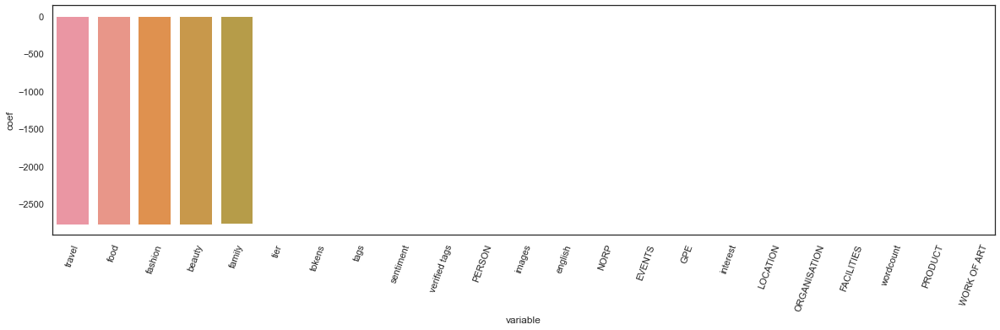

In [410]:
# Plot Coefficients
plt.figure(figsize=(20,5))
plt.xticks(rotation=70)
view_coeff(X, lr)

In [411]:
from sklearn.metrics import mean_squared_error

In [507]:
#Try boxcox
lr_bc = LinearRegression()
lr_bc.fit(X_train_bc, y_train)
lr_bc.score(X_test_bc, y_test)

0.0878698766223841

### Ridge Regression

In [412]:
## Calculate Ridge Regression model

# create a model object to hold the modelling parameters
rid = Ridge()

# keep track of the intermediate results for coefficients and errors
rid_coefs = []
rid_errors = []

# create a range of alphas to calculate
ridge_alphas = np.logspace(-6, 6, 200)

# Train the model with different regularisation strengths
for a in ridge_alphas:
    rid.set_params(alpha = a)
    rid.fit(X_train_mm, y_train)
    rid_coefs.append(rid.coef_)
    rid_errors.append(mean_squared_error(rid.coef_, lr.coef_))

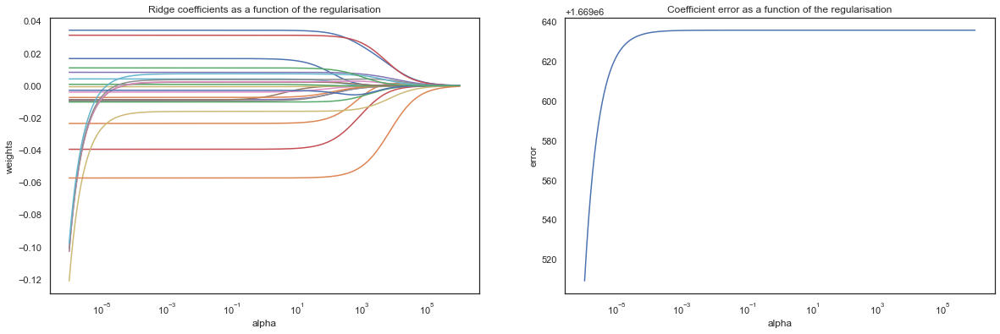

In [413]:
# Display results
plt.figure(figsize = (20, 6))

plt.subplot(121)
ax = plt.gca()
ax.plot(ridge_alphas, rid_coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Ridge coefficients as a function of the regularisation')
plt.axis('tight')

plt.subplot(122)
ax = plt.gca()
ax.plot(ridge_alphas, rid_errors)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('error')
plt.title('Coefficient error as a function of the regularisation')
plt.axis('tight')

plt.show()

In [414]:
optimal_ridge = RidgeCV(alphas=ridge_alphas, cv=10)
optimal_ridge.fit(X_train_mm, y_train)
print('Alpha:', optimal_ridge.alpha_)
print('Score:', optimal_ridge.score(X_test_mm, y_test))

Alpha: 17.22585965398784
Score: 0.071365290525095


In [401]:
from sklearn import metrics

rid_pred = optimal_ridge.predict(X_test_mm)
MAE = metrics.mean_absolute_error(y_test , rid_pred)
print('Mean Absolute Error (MAE):', MAE)
MSE = metrics.mean_squared_error(y_test, rid_pred)
print('Mean Squared Error (MSE):', MSE)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, rid_pred))
print('Root Mean Squared Error (RMSE):', RMSE)
R2 = metrics.r2_score(y_test, rid_pred)
print('R2: ', R2)
#mape = np.mean(np.abs((y_test - rfr_pred) / np.abs(y_test)))
#print('Mean Absolute Percentage Error (MAPE):', round(mape * 100, 2))
#print('Accuracy:', round(100*(1 - mape), 2))

Mean Absolute Error (MAE): 0.006611206211759645
Mean Squared Error (MSE): 0.00014873832135535553
Root Mean Squared Error (RMSE): 0.012195832130500794
R2:  0.071365290525095


In [415]:
evaluators = [MAE, MSE, RMSE, R2]
result = pd.DataFrame({'Ridge' : [round(num,3) for num in evaluators]})

In [416]:
result

,Ridge
0,0.007
1,0.000
2,0.012
3,0.071


In [515]:
#Try box cox
optimal_ridge_bc = RidgeCV(alphas=ridge_alphas, cv=10)
optimal_ridge_bc.fit(X_train_bc, y_train)
print('Alpha:', optimal_ridge_bc.alpha_)
print('Score:', optimal_ridge_bc.score(X_test_bc, y_test))
rid_pred_bc = optimal_ridge_bc.predict(X_test_bc)
MAE = metrics.mean_absolute_error(y_test , rid_pred_bc)
print('Mean Absolute Error (MAE):', MAE)
MSE = metrics.mean_squared_error(y_test, rid_pred_bc)
print('Mean Squared Error (MSE):', MSE)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, rid_pred_bc))
print('Root Mean Squared Error (RMSE):', RMSE)
R2 = metrics.r2_score(y_test, rid_pred_bc)
print('R2: ', R2)

Alpha: 158.85651294280527
Score: 0.08786476944169264
Mean Absolute Error (MAE): 0.029360668645068633
Mean Squared Error (MSE): 0.002994113638649187
Root Mean Squared Error (RMSE): 0.054718494484490225
R2:  0.08786476944169264


In [525]:
#result = result.join(pd.DataFrame({'Ridge Boxcox' : [round(num,3) for num in evaluators]}))

In [529]:
#result = result.set_index('evaluators')

In [530]:
result

,Ridge,Lasso,SVR Linear,SVR Rbf,Random Forest,Ridge Boxcox
evaluators,,,,,,
MAE,0.007,0.030298,0.030,0.030,0.029,0.030
MSE,0.000,0.002598,0.003,0.003,0.002,0.003
RMSE,0.012,0.050968,0.051,0.051,0.050,0.051
R2,0.071,0.080823,0.081,0.081,0.123,0.081


### Lasso Regression

In [463]:
## Calculate Lasso Regression model

# create a model object to hold the modelling parameters
las = Lasso(max_iter=1000000)

# keep track of the intermediate results for coefficients and errors
las_coefs = []
las_errors = []

# create a range of alphas to calculate
lasso_alphas = np.logspace(-6, 6, 200)

# Train the model with different regularisation strengths
for a in lasso_alphas:
    las.set_params(alpha=a)
    las.fit(X_train_mm,y_train)
    las_coefs.append(las.coef_)
    las_errors.append(mean_squared_error(las.coef_,lr.coef_))

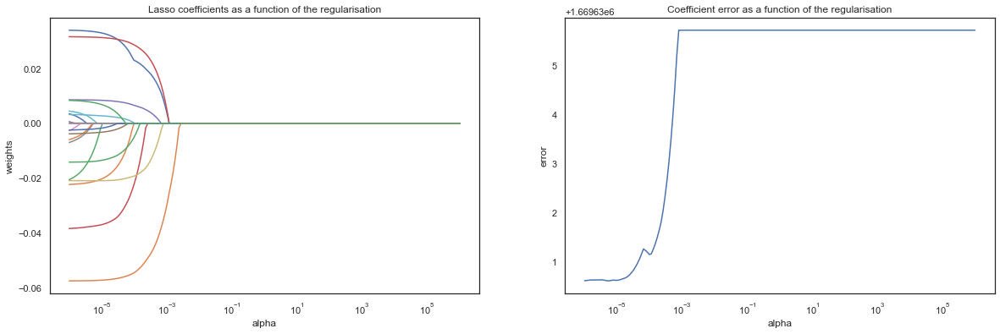

In [464]:
# Display results
plt.figure(figsize = (20, 6))

plt.subplot(121)
ax = plt.gca()
ax.plot(lasso_alphas, las_coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Lasso coefficients as a function of the regularisation')
plt.axis('tight')

plt.subplot(122)
ax = plt.gca()
ax.plot(lasso_alphas, las_errors)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('error')
plt.title('Coefficient error as a function of the regularisation')
plt.axis('tight')

plt.show()

In [465]:
# Find Optimal Lasso Using LassoCV
optimal_lasso = LassoCV(alphas=lasso_alphas, cv=10)
optimal_lasso.fit(X_train_mm, y_train)
print('Alpha:', optimal_lasso.alpha_)
print('Score:', optimal_lasso.score(X_test_mm, y_test))

Alpha: 1.3987131026472387e-05
Score: 0.08082289582926194


In [466]:
las_pred = optimal_lasso.predict(X_test_mm)
MAE = metrics.mean_absolute_error(y_test , las_pred)
print('Mean Absolute Error (MAE):', MAE)
MSE = metrics.mean_squared_error(y_test, las_pred)
print('Mean Squared Error (MSE):', MSE)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, las_pred))
print('Root Mean Squared Error (RMSE):', RMSE)
R2 = metrics.r2_score(y_test, las_pred)
print('R2: ', R2)
evaluators = [MAE, MSE, RMSE, R2]

Mean Absolute Error (MAE): 0.03029762422687086
Mean Squared Error (MSE): 0.002597687638447865
Root Mean Squared Error (RMSE): 0.050967515521632645
R2:  0.08082289582926194


In [ ]:
#result = result.join(pd.DataFrame({'Lasso' : [round(num,3) for num in evaluators]}))

In [470]:
result['Lasso'] = evaluators
result

,Ridge,Lasso,SVR Linear,SVR Rbf,Random Forest
0,0.007,0.030298,0.030,0.030,0.029
1,0.000,0.002598,0.003,0.003,0.002
2,0.012,0.050968,0.051,0.051,0.050
3,0.071,0.080823,0.081,0.081,0.123


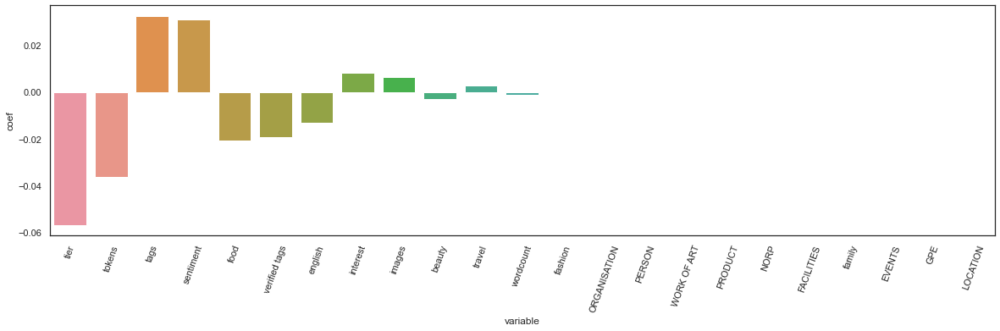

In [472]:
# Plot Coefficients
plt.figure(figsize=(20,5))
plt.xticks(rotation=70)
view_coeff(X, optimal_lasso)

In [531]:
#Try box cox
optimal_lasso_bc = LassoCV(alphas=lasso_alphas, cv=10)
optimal_lasso_bc.fit(X_train_bc, y_train)
print('Alpha:', optimal_lasso_bc.alpha_)
print('Score:', optimal_lasso_bc.score(X_test_bc, y_test))
las_pred_bc = optimal_lasso_bc.predict(X_test_bc)
MAE = metrics.mean_absolute_error(y_test , las_pred_bc)
print('Mean Absolute Error (MAE):', MAE)
MSE = metrics.mean_squared_error(y_test, las_pred_bc)
print('Mean Squared Error (MSE):', MSE)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, las_pred_bc))
print('Root Mean Squared Error (RMSE):', RMSE)
R2 = metrics.r2_score(y_test, las_pred_bc)
print('R2: ', R2)

Alpha: 2.121451784910628e-05
Score: 0.08785658712668132
Mean Absolute Error (MAE): 0.029359501331928512
Mean Squared Error (MSE): 0.0029941404973650334
Root Mean Squared Error (RMSE): 0.05471873991024495
R2:  0.08785658712668132


In [535]:
evaluators = [MAE, MSE, RMSE, R2]
#result = result.join(pd.DataFrame({'Lasso Boxcox' : [round(num,3) for num in evaluators]}))
result['Lasso Boxcox'] = [round(num,3) for num in evaluators]

In [536]:
result

,Ridge,Lasso,SVR Linear,SVR Rbf,Random Forest,Ridge Boxcox,Lasso Boxcox
evaluators,,,,,,,
MAE,0.007,0.030298,0.030,0.030,0.029,0.030,0.029
MSE,0.000,0.002598,0.003,0.003,0.002,0.003,0.003
RMSE,0.012,0.050968,0.051,0.051,0.050,0.051,0.055
R2,0.071,0.080823,0.081,0.081,0.123,0.081,0.088


### SVR

In [539]:
from sklearn.svm import SVR

X_train_mm, X_test_mm, y_train, y_test = train_test_split(X_mm,y,test_size=0.8, random_state=1)

In [540]:
from sklearn.svm import LinearSVR
svr = LinearSVR(random_state=0)
svr.fit(X_train_mm,y_train)

/opt/anaconda3/envs/nlp21v0/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


LinearSVR(random_state=0)

In [541]:
svr_pred = svr.predict(X_test_mm)
MAE = metrics.mean_absolute_error(y_test , svr_pred)
print('Mean Absolute Error (MAE):', MAE)
MSE = metrics.mean_squared_error(y_test, svr_pred)
print('Mean Squared Error (MSE):', MSE)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, svr_pred))
print('Root Mean Squared Error (RMSE):', RMSE)
R2 = metrics.r2_score(y_test, svr_pred)
print('R2: ', R2)
evaluators = [MAE, MSE, RMSE, R2]

Mean Absolute Error (MAE): 0.028280554869730003
Mean Squared Error (MSE): 0.002762849941105956
Root Mean Squared Error (RMSE): 0.05256281899885085
R2:  0.02238114754957099


In [542]:
#result = result.join(pd.DataFrame({'SVR Linear' : [round(num,3) for num in evaluators]}))
result['SVR Linear'] = [round(num,3) for num in evaluators]
result

,Ridge,Lasso,SVR Linear,SVR Rbf,Random Forest,Ridge Boxcox,Lasso Boxcox
evaluators,,,,,,,
MAE,0.007,0.030298,0.028,0.030,0.029,0.030,0.029
MSE,0.000,0.002598,0.003,0.003,0.002,0.003,0.003
RMSE,0.012,0.050968,0.053,0.051,0.050,0.051,0.055
R2,0.071,0.080823,0.022,0.081,0.123,0.081,0.088


In [434]:
svr = SVR(kernel='rbf')
svr.fit(X_train_mm,y_train)
svr_pred = optimal_lasso.predict(X_test_mm)
MAE = metrics.mean_absolute_error(y_test , svr_pred)
print('Mean Absolute Error (MAE):', MAE)
MSE = metrics.mean_squared_error(y_test, svr_pred)
print('Mean Squared Error (MSE):', MSE)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, svr_pred))
print('Root Mean Squared Error (RMSE):', RMSE)
R2 = metrics.r2_score(y_test, svr_pred)
print('R2: ', R2)
evaluators = [MAE, MSE, RMSE, R2]
result = result.join(pd.DataFrame({'SVR Rbf' : [round(num,3) for num in evaluators]}))
result

Mean Absolute Error (MAE): 0.030267507334858085
Mean Squared Error (MSE): 0.002596612994790406
Root Mean Squared Error (RMSE): 0.05095697199393235
R2:  0.0812031524199538


,Ridge,Lasso,SVR Linear,SVR Rbf
0,0.007,0.030,0.030,0.030
1,0.000,0.003,0.003,0.003
2,0.012,0.055,0.051,0.051
3,0.071,0.071,0.081,0.081


In [547]:
#Try box cox

X_train_bc, X_test_bc, y_train, y_test = train_test_split(X_bc,y,test_size=0.1, random_state=1)

svrl_bc = LinearSVR(random_state=0, max_iter = 2000)
svrl_bc.fit(X_train_bc, y_train)

svrl_pred_bc = svrl_bc.predict(X_test_bc)
MAE = metrics.mean_absolute_error(y_test , svrl_pred_bc)
print('Mean Absolute Error (MAE):', MAE)
MSE = metrics.mean_squared_error(y_test, svrl_pred_bc)
print('Mean Squared Error (MSE):', MSE)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, svrl_pred_bc))
print('Root Mean Squared Error (RMSE):', RMSE)
R2 = metrics.r2_score(y_test, svrl_pred_bc)
print('R2: ', R2)

Mean Absolute Error (MAE): 0.02830140644806663
Mean Squared Error (MSE): 0.0032333622915861177
Root Mean Squared Error (RMSE): 0.05686266166462943
R2:  0.014979384468179702


/opt/anaconda3/envs/nlp21v0/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


In [552]:
evaluators = [MAE, MSE, RMSE, R2]
#result = result.join(pd.DataFrame({'Linear SVR Boxcox' : [round(num,3) for num in evaluators]}))
result['Linear SVR Boxcox']= [round(num,3) for num in evaluators]

In [553]:
result

,Ridge,Lasso,SVR Linear,SVR Rbf,Random Forest,Ridge Boxcox,Lasso Boxcox,Linear SVR Boxcox
evaluators,,,,,,,,
MAE,0.007,0.030298,0.028,0.030,0.029,0.030,0.029,0.028
MSE,0.000,0.002598,0.003,0.003,0.002,0.003,0.003,0.003
RMSE,0.012,0.050968,0.053,0.051,0.050,0.051,0.055,0.057
R2,0.071,0.080823,0.022,0.081,0.123,0.081,0.088,0.015


In [556]:
#use boxcox

X_train_bc, X_test_bc, y_train, y_test = train_test_split(X_bc,y,test_size=0.5, random_state=1)

svrk_bc = SVR(kernel='rbf')
svrk_bc.fit(X_train_bc, y_train)

svrk_pred_bc = svrk_bc.predict(X_test_bc)
MAE = metrics.mean_absolute_error(y_test , svrk_pred_bc)
print('Mean Absolute Error (MAE):', MAE)
MSE = metrics.mean_squared_error(y_test, svrk_pred_bc)
print('Mean Squared Error (MSE):', MSE)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, svrk_pred_bc))
print('Root Mean Squared Error (RMSE):', RMSE)
R2 = metrics.r2_score(y_test, svrk_pred_bc)
print('R2: ', R2)

Mean Absolute Error (MAE): 0.06363916560361821
Mean Squared Error (MSE): 0.005645408667479642
Root Mean Squared Error (RMSE): 0.0751359345951033
R2:  -0.9057323408193132


In [557]:
evaluators = [MAE, MSE, RMSE, R2]
#result = result.join(pd.DataFrame({'Linear SVR Boxcox' : [round(num,3) for num in evaluators]}))
result['RBF SVR Boxcox']= [round(num,3) for num in evaluators]

In [558]:
result

,Ridge,Lasso,SVR Linear,SVR Rbf,Random Forest,Ridge Boxcox,Lasso Boxcox,Linear SVR Boxcox,RBF SVR Boxcox
evaluators,,,,,,,,,
MAE,0.007,0.030298,0.028,0.030,0.029,0.030,0.029,0.028,0.064
MSE,0.000,0.002598,0.003,0.003,0.002,0.003,0.003,0.003,0.006
RMSE,0.012,0.050968,0.053,0.051,0.050,0.051,0.055,0.057,0.075
R2,0.071,0.080823,0.022,0.081,0.123,0.081,0.088,0.015,-0.906


#### Random Forest Regressor

In [577]:
X_train_mm, X_test_mm, y_train, y_test = train_test_split(X_mm,y,test_size=0.1, random_state=1)

from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn import metrics

rfr = RandomForestRegressor(max_depth=5, random_state=0)
rfr.fit(X_train_mm, y_train)

rfr_pred = rfr.predict(X_test_mm)
MAE = metrics.mean_absolute_error(y_test , rfr_pred)
print('Mean Absolute Error (MAE):', MAE)
MSE = metrics.mean_squared_error(y_test, rfr_pred)
print('Mean Squared Error (MSE):', MSE)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, rfr_pred))
print('Root Mean Squared Error (RMSE):', RMSE)
R2 = metrics.r2_score(y_test, rfr_pred)
print('R2: ', R2)
evaluators = [MAE, MSE, RMSE, R2]
#result = result.join(pd.DataFrame({'Random Forest' : [round(num,3) for num in evaluators]}))
result['Random Forest'] = [round(num,3) for num in evaluators]
result

Mean Absolute Error (MAE): 0.028701758456738596
Mean Squared Error (MSE): 0.002926516722138627
Root Mean Squared Error (RMSE): 0.054097289415816645
R2:  0.10845768489770291


,Ridge,Lasso,SVR Linear,SVR Rbf,Random Forest,Ridge Boxcox,Lasso Boxcox,Linear SVR Boxcox,RBF SVR Boxcox,Random Forest Boxcox
evaluators,,,,,,,,,,
MAE,0.007,0.030298,0.028,0.030,0.029,0.030,0.029,0.028,0.064,0.029
MSE,0.000,0.002598,0.003,0.003,0.003,0.003,0.003,0.003,0.006,0.003
RMSE,0.012,0.050968,0.053,0.051,0.054,0.051,0.055,0.057,0.075,0.054
R2,0.071,0.080823,0.022,0.081,0.108,0.081,0.088,0.015,-0.906,0.108


In [519]:
result['evaluators'] = ['MAE', 'MSE', 'RMSE', 'R2']
result.set_index('evaluators')

,Ridge,Lasso,SVR Linear,SVR Rbf,Random Forest
evaluators,,,,,
MAE,0.007,0.030298,0.030,0.030,0.029
MSE,0.000,0.002598,0.003,0.003,0.002
RMSE,0.012,0.050968,0.051,0.051,0.050
R2,0.071,0.080823,0.081,0.081,0.123


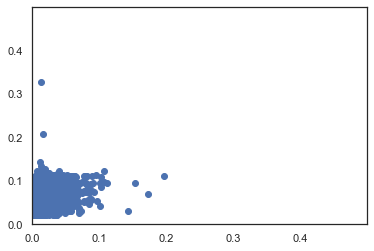

In [600]:
min = 0
max = 0.5
plt.xlim([min,max])
plt.ylim([min,max])
plt.yticks(np.arange(min, max, 0.1))
plt.xticks(np.arange(min, max, 0.1))
plt.scatter(y_test_mm, rfr_pred)


In [437]:
#Check train dataset
rfr_pred_train = rfr.predict(X_train_mm)
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_train, rfr_pred_train))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_train, rfr_pred_train))
print('Root Mean Squared Error (RMSE):', np.sqrt(metrics.mean_squared_error(y_train, rfr_pred_train)))
print('R2: ', metrics.r2_score(y_train, rfr_pred_train))

from sklearn.model_selection import cross_val_score
print('Cross Validation Score:', cross_val_score(rfr, X_train_mm, y_train, cv=5))

Mean Absolute Error (MAE): 0.028744275803517995
Mean Squared Error (MSE): 0.002207308052906323
Root Mean Squared Error (RMSE): 0.046981997114919696
R2:  0.21955324785177754
Cross Validation Score: [0.13572964 0.13022733 0.13450509 0.11584507 0.07030266]


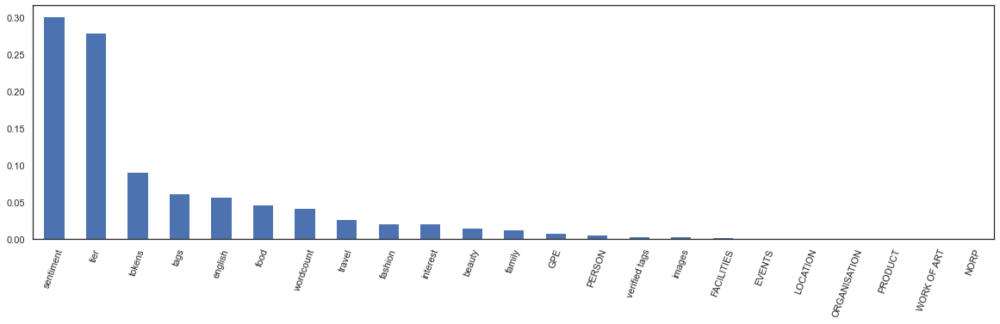

In [478]:
feat_impt = pd.Series(rfr.feature_importances_, index=[col_dict[col] for col in X_train.columns])
plt.figure(figsize=(20,5))
feat_impt.sort_values(ascending=False).plot(kind='bar')
plt.xticks(rotation=70)
plt.show()

In [559]:
#use boxcox

X_train_bc, X_test_bc, y_train, y_test = train_test_split(X_bc,y,test_size=0.1, random_state=1)

rfr_bc = RandomForestRegressor(max_depth=5, random_state=0)
rfr_bc.fit(X_train_bc, y_train)

rfr_pred_bc = rfr_bc.predict(X_test_bc)
MAE = metrics.mean_absolute_error(y_test , rfr_pred_bc)
print('Mean Absolute Error (MAE):', MAE)
MSE = metrics.mean_squared_error(y_test, rfr_pred_bc)
print('Mean Squared Error (MSE):', MSE)
RMSE = np.sqrt(metrics.mean_squared_error(y_test, rfr_pred_bc))
print('Root Mean Squared Error (RMSE):', RMSE)
R2 = metrics.r2_score(y_test, rfr_pred_bc)
print('R2: ', R2)

Mean Absolute Error (MAE): 0.028699772315367314
Mean Squared Error (MSE): 0.0029267941579156813
Root Mean Squared Error (RMSE): 0.05409985358497453
R2:  0.10837316607944503


In [560]:
evaluators = [MAE, MSE, RMSE, R2]
#result = result.join(pd.DataFrame({'Linear SVR Boxcox' : [round(num,3) for num in evaluators]}))
result['Random Forest Boxcox']= [round(num,3) for num in evaluators]

In [561]:
result

,Ridge,Lasso,SVR Linear,SVR Rbf,Random Forest,Ridge Boxcox,Lasso Boxcox,Linear SVR Boxcox,RBF SVR Boxcox,Random Forest Boxcox
evaluators,,,,,,,,,,
MAE,0.007,0.030298,0.028,0.030,0.029,0.030,0.029,0.028,0.064,0.029
MSE,0.000,0.002598,0.003,0.003,0.002,0.003,0.003,0.003,0.006,0.003
RMSE,0.012,0.050968,0.053,0.051,0.050,0.051,0.055,0.057,0.075,0.054
R2,0.071,0.080823,0.022,0.081,0.123,0.081,0.088,0.015,-0.906,0.108


In [601]:
X_train_mm, X_test_mm, y_train_mm, y_test_mm = train_test_split(X_mm,y_mm,test_size=0.1, random_state=1)

import sklearn
from sklearn.neural_network import MLPRegressor
mlpreg = MLPRegressor(random_state=1, max_iter=500).fit(X_train_mm,y_train_mm)
ml_pred = mlpreg.predict(X_test_mm)
score = mlpreg.score(X_test_mm, y_test_mm)
print('Score:', score)

MAE = metrics.mean_absolute_error(y_test_mm , ml_pred)
print('Mean Absolute Error (MAE):', MAE)
MSE = metrics.mean_squared_error(y_test_mm, ml_pred)
print('Mean Squared Error (MSE):', MSE)
RMSE = np.sqrt(metrics.mean_squared_error(y_test_mm, ml_pred))
print('Root Mean Squared Error (RMSE):', RMSE)
R2 = metrics.r2_score(y_test_mm, ml_pred)
print('R2: ', R2)

Score: -0.004612693290025227
Mean Absolute Error (MAE): 0.006305412437787197
Mean Squared Error (MSE): 0.00016090762501945764
Root Mean Squared Error (RMSE): 0.01268493693399607
R2:  -0.004612693290025227


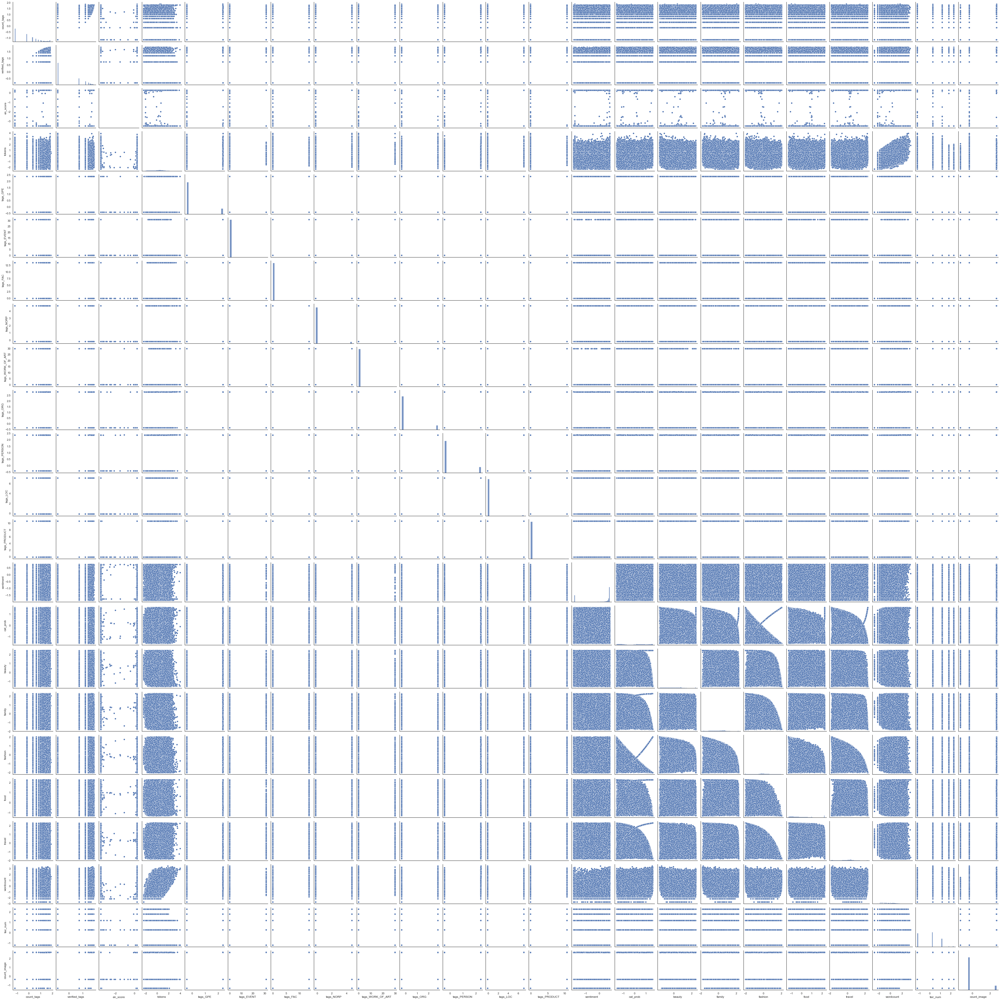

In [565]:
sns.pairplot(X_bc)

Below section to search for optimised parameters is obsolete and does not seem to give better results

In [194]:
from pprint import pprint
print('Parameters currently in use:\n')
pprint(rfr.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': 20,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}


In [195]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [196]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator =  rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train_sc, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


/opt/anaconda3/envs/nlp21v0/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [198]:
best_rfr =rf_random.best_estimator_
best_rfr_predict=best_rfr.predict(X_test_sc)

MAE = metrics.mean_absolute_error(y_test , best_rfr_predict)
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_test, best_rfr_predict))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_test, best_rfr_predict))
print('Root Mean Squared Error (RMSE):', np.sqrt(metrics.mean_squared_error(y_test, best_rfr_predict)))
print('R2: ', metrics.r2_score(y_test, best_rfr_predict))
#mape = np.mean(np.abs((y_test - rfr_pred) / np.abs(y_test)))
#print('Mean Absolute Percentage Error (MAPE):', round(mape * 100, 2))
#print('Accuracy:', round(100*(1 - mape), 2))

Mean Absolute Error (MAE): 0.028228144276565944
Mean Squared Error (MSE): 0.0024734549787998176
Root Mean Squared Error (RMSE): 0.04973384138390898
R2:  0.14837763490363354


#### Let's try to transform Y

In [438]:
# define the target transform wrapper
from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import MinMaxScaler
optimal_lasso = LassoCV(alphas=lasso_alphas, cv=10)
wrapped_model = TransformedTargetRegressor(regressor=RandomForestRegressor(max_depth=5, random_state=0), transformer=MinMaxScaler())

In [440]:
wrapped_model.fit(X_train_mm, y_train)
yhat = wrapped_model.predict(X_test_mm)

In [442]:
from sklearn import metrics
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_test, yhat))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_test, yhat))
print('Root Mean Squared Error (RMSE):', np.sqrt(metrics.mean_squared_error(y_test, yhat)))
print('R2: ', metrics.r2_score(y_test, yhat))

from sklearn.model_selection import cross_val_score
print('Cross Validation Score:', cross_val_score(wrapped_model, X_train_mm, y_train, cv=5))

Mean Absolute Error (MAE): 0.029006670460180194
Mean Squared Error (MSE): 0.002478733187700222
Root Mean Squared Error (RMSE): 0.04978687766570848
R2:  0.12291425660263455
Cross Validation Score: [0.13229785 0.12984729 0.13420869 0.11576425 0.06801752]


### Business application

In [605]:
#Look at how each variable varies with engagement rate
data_mm = X_mm_df
data_mm['engagement_rate'] = y_mm
data_mm.head()

,count_tags,verified_tags,en_score,tokens,tags_GPE,tags_EVENT,tags_FAC,tags_NORP,tags_WORK_OF_ART,tags_ORG,...,cat_prob,beauty,family,fashion,food,travel,wordcount,tier_num,count_image,engagement_rate
0,0.041667,0.00,0.999994,0.000014,0.0,0.0,0.0,0.0,0.0,0.2,...,0.601829,0.061960,0.097648,0.602138,0.073940,0.165015,0.057751,0.0,0.169231,0.007396
1,0.166667,0.15,0.999995,0.000037,0.0,0.0,0.0,0.0,0.0,0.0,...,0.624868,0.200945,0.090412,0.625179,0.010840,0.073465,0.079027,0.0,0.003077,0.010876
2,0.041667,0.05,0.599997,0.000023,0.0,0.0,0.0,0.0,0.0,0.0,...,0.522635,0.061735,0.139456,0.522934,0.101699,0.174961,0.018237,0.0,0.003077,0.011094
3,0.083333,0.05,0.999992,0.000038,0.0,0.0,0.0,0.0,0.0,0.0,...,0.550324,0.133764,0.092481,0.550626,0.051428,0.172447,0.063830,0.0,0.169231,0.010441
4,0.041667,0.00,0.799998,0.000049,0.0,0.0,0.0,0.0,0.0,0.1,...,0.550244,0.136658,0.092467,0.550546,0.038953,0.182123,0.072948,0.0,0.086154,0.007287


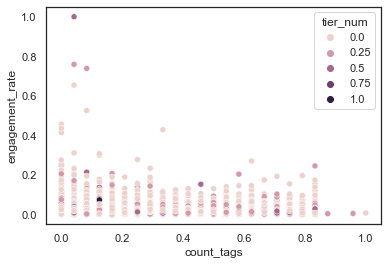

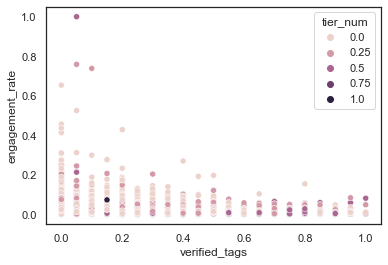

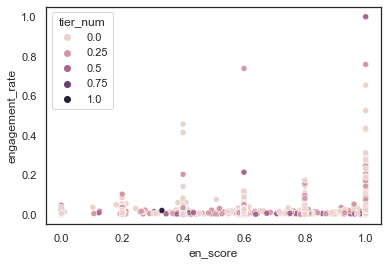

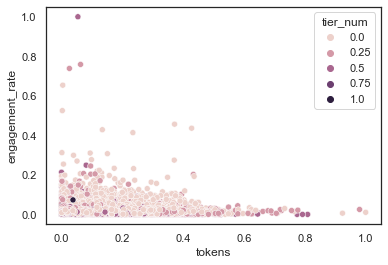

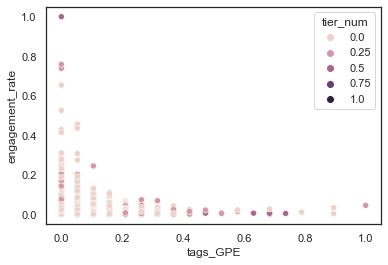

...

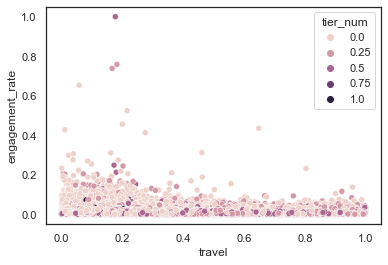

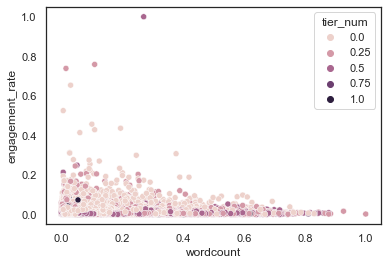

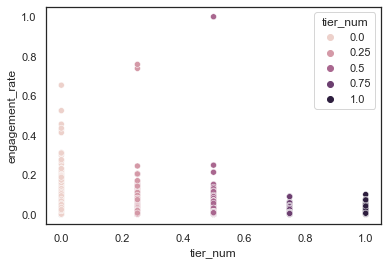

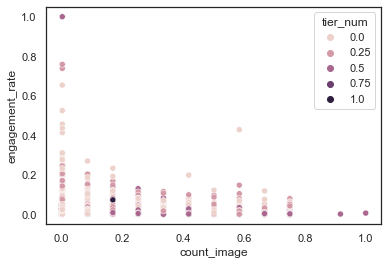

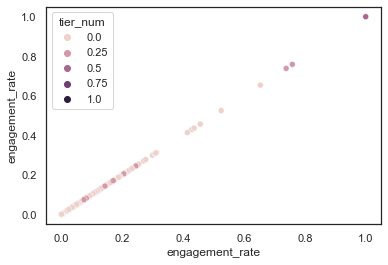

In [609]:
for col in X_mm_df.columns:
    sns.scatterplot(data=data_mm, x=col, y='engagement_rate', hue= 'tier_num')
    plt.show()

In [614]:
X_mm_df.head().T

,0,1,2,3,4
count_tags,0.041667,0.166667,0.041667,0.083333,0.041667
verified_tags,0.000000,0.150000,0.050000,0.050000,0.000000
en_score,0.999994,0.999995,0.599997,0.999992,0.799998
tokens,0.000014,0.000037,0.000023,0.000038,0.000049
tags_GPE,0.000000,0.000000,0.000000,0.000000,0.000000
tags_EVENT,0.000000,0.000000,0.000000,0.000000,0.000000
tags_FAC,0.000000,0.000000,0.000000,0.000000,0.000000
tags_NORP,0.000000,0.000000,0.000000,0.000000,0.000000
tags_WORK_OF_ART,0.000000,0.000000,0.000000,0.000000,0.000000
tags_ORG,0.200000,0.000000,0.000000,0.000000,0.100000


### Business Application

In [612]:
#Look at which influencers has better sentiments
df_average = dfs10_en.groupby('influencer').mean(numeric_only=True)

In [617]:
influencer_data.head()

,Category,#Followers,#Followees,#Posts,tier
Username,,,,,
makeupbynvs,beauty,1432.0,1089.0,363.0,Nano
jaquelinevandoski,beauty,137600.0,548.0,569.0,Mid-tier
anisaartistry,beauty,64644.0,289.0,391.0,Mid-tier
rubina_muartistry,beauty,496406.0,742.0,887.0,Mid-tier
beautyxabbi,beauty,2050.0,1423.0,751.0,Nano


In [619]:
cat_dict = dict(zip(influencer_data.index, influencer_data.Category))

In [620]:
df_average['category'] = df_average.index.map(cat_dict)

In [623]:
df_average.columns

Index(['comment_counts', 'likes', 'count_tags', 'verified_tags', 'en_score',
       'tokens', 'tags_GPE', 'tags_EVENT', 'tags_FAC', 'tags_NORP',
       'tags_WORK_OF_ART', 'tags_ORG', 'tags_PERSON', 'tags_LOC',
       'tags_PRODUCT', 'sentiment', 'cat_prob', 'beauty', 'family', 'fashion',
       'food', 'travel', 'engagement_rate', 'wordcount', 'tier_num',
       'count_image', 'category'],
      dtype='object')

In [631]:
for num, cat in enumerate(['Nano', 'Micro', 'Mid-tier','Macro','Mega']):
    print (num, cat)

0 Nano
1 Micro
2 Mid-tier
3 Macro
4 Mega


In [626]:
df_average[df_average['tier_num']==1]

,comment_counts,likes,count_tags,verified_tags,en_score,tokens,tags_GPE,tags_EVENT,tags_FAC,tags_NORP,...,beauty,family,fashion,food,travel,engagement_rate,wordcount,tier_num,count_image,category
influencer,,,,,,,,,,,,,,,,,,,,,
00s_supermodels,0.875000,84.875000,1.375000,0.75,0.946425,108.801811,0.125000,0.0,0.0,0.0,...,0.102643,0.109288,0.570025,0.061925,0.156119,0.042221,16.125000,1.0,67.500000,fashion
100pintas,9.000000,145.000000,3.000000,0.00,0.857140,424.535040,0.000000,0.0,0.0,0.0,...,0.031745,0.522300,0.392127,0.028964,0.024864,0.015549,12.000000,1.0,27.000000,family
14th_avenue_photography,2.600000,82.400000,1.300000,0.30,0.999997,1379.526394,0.400000,0.0,0.0,0.0,...,0.055781,0.132278,0.532434,0.037382,0.242125,0.077626,30.700000,1.0,27.000000,travel
15minbeauty,4.200000,60.700000,0.000000,0.00,0.999997,2471.084063,0.200000,0.0,0.0,0.0,...,0.099705,0.055238,0.702339,0.030444,0.112275,0.012048,36.100000,1.0,26.800000,beauty
17maggiezine,6.777778,275.111111,1.444444,0.00,0.968251,1607.634639,0.000000,0.0,0.0,0.0,...,0.060936,0.168417,0.586164,0.050239,0.134244,0.188051,8.222222,1.0,26.777778,family
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zulian_calzature,0.500000,38.625000,0.125000,0.00,0.857141,853517.213617,0.125000,0.0,0.0,0.0,...,0.038421,0.032609,0.806630,0.057870,0.064469,0.017825,35.250000,1.0,27.000000,fashion
zurich.influencers,55.000000,348.900000,7.400000,0.60,0.999997,876036.516133,0.700000,0.0,0.0,0.2,...,0.015240,0.050080,0.509583,0.215619,0.209479,0.102904,51.600000,1.0,43.200000,fashion
zwithlove,12.000000,200.250000,5.000000,0.50,0.946426,44034.980853,0.000000,0.0,0.0,0.0,...,0.094455,0.080215,0.575769,0.066440,0.183121,0.047303,6.250000,1.0,30.375000,fashion


In [679]:
df_average['beauty'].mean()

0.057266523819295576

In [683]:
import plotly.express as px
import pandas as pd

df = pd.DataFrame(dict(
    r=[df_average['fashion'].mean(),df_average['travel'].mean(),df_average['family'].mean(),
               df_average['food'].mean(), df_average['beauty'].mean()],
    theta=['fashion', 'travel', 'family', 'food', 'beauty']))
fig = px.line_polar(df, r='r', theta='theta', line_close=True)
fig.show()

In [655]:
a,b,c,d,e = sns.color_palette("muted")[:5]

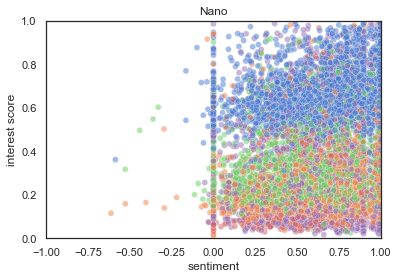

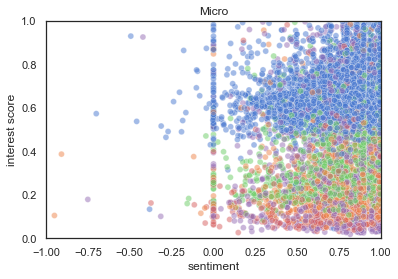

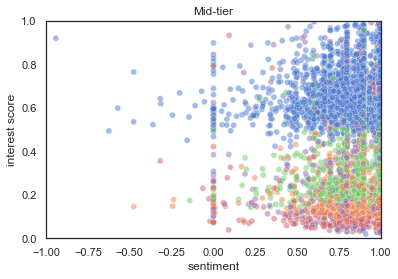

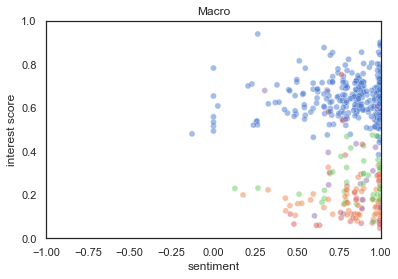

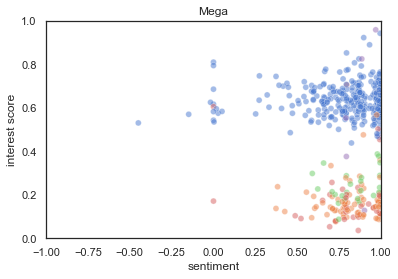

In [659]:
#Sentiment and interest performance
tier_list = ['Nano', 'Micro', 'Mid-tier','Macro','Mega']
color_dict = dict({'fashion':a,
                  'family':b,
                  'travel': c,
                  'beauty': d,
                   'food': e})
for num, cat in enumerate(tier_list):
    plt.ylabel('interest score')
    plt.title(cat)
    plt.xlim(-1,1)
    plt.ylim(0,1)
    sns.scatterplot(data=df_average[df_average['tier_num']==num+1], x='sentiment', y='cat_prob', 
                    hue='category', alpha=0.5, palette=color_dict, legend=False)
    plt.show()

In [ ]:
#Sentiment performance


Below sections to be ignored

In [66]:
import spacy

In [75]:
from collections import Counter

In [78]:
from spacy import displacy

In [88]:
import seaborn as sns

In [69]:
ner = spacy.load("en_core_web_lg")

Below section is to explore NER on sub sample:

In [82]:
#We can see that no_hashtags field gives the cleanest result

text = df_captions.loc['0ldisme', 'no_hashtags']
displacy.render(ner(text), style='ent', jupyter=True)

In [72]:
def _get_ner (text):
    doc = ner(text)
    return [X.label_ for X in doc.ents]

In [76]:
def plot_named_entity_barchart(text):
    #text input here is dataframe
    ent = text.apply(lambda x : _get_ner(x))
    ent = [x for sub in ent for x in sub]
    counter = Counter(ent)
    count = counter.most_common()
    
    x,y = map(list, zip(*count))
    sns.barplot(x=y, y=x)

In [86]:
text_df = df_captions['no_hashtags'].iloc[:10]

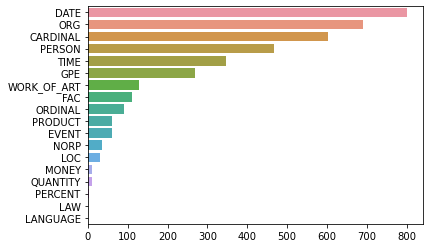

In [89]:
plot_named_entity_barchart(text_df)

Create new columns with counts for each NER Type

In [90]:
import collections
lst_tag_type = ["ORG","PERSON","NORP","GPE","LOC","FAC","EVENT","PRODUCT","WORK_OF_ART"]

In [91]:
def utils_ner_text(txt, ner=None, lst_tag_filter=None, grams_join="_"):
    ## apply model
    ner = spacy.load("en_core_web_lg") if ner is None else ner
    entities = ner(txt).ents

    ## tag text
    tagged_txt = txt
    for tag in entities:
        if (lst_tag_filter is None) or (tag.label_ in lst_tag_filter):
            try:
                tagged_txt = re.sub(tag.text, grams_join.join(tag.text.split()), tagged_txt) #it breaks with wild characters like *+
            except Exception as e:
                continue

    ## extract tags list
    if lst_tag_filter is None:
        lst_tags = [(tag.text, tag.label_) for tag in entities]  #list(set([(word.text, word.label_) for word in ner(x).ents]))
    else: 
        lst_tags = [(word.text, word.label_) for word in entities if word.label_ in lst_tag_filter]

    return tagged_txt, lst_tags

In [92]:
def add_ner_spacy(dtf, column, ner=None, lst_tag_filter=None, grams_join="_", create_features=True):
    ner = spacy.load("en_core_web_lg") if ner is None else ner

    ## tag text and exctract tags
    print("--- tagging ---")
    dtf[[column+"_tagged", "tags"]] = dtf[[column]].apply(lambda x: utils_ner_text(x[0], ner, lst_tag_filter, grams_join), 
                                                          axis=1, result_type='expand')

    ## put all tags in a column
    print("--- counting tags ---")
    dtf["tags"] = dtf["tags"].apply(lambda x: utils_lst_count(x, top=None))
    
    ## extract features
    if create_features == True:
        print("--- creating features ---")
        ### features set
        tags_set = []
        for lst in dtf["tags"].tolist():
            for dic in lst:
                for k in dic.keys():
                    tags_set.append(k[1])
        tags_set = list(set(tags_set))
        ### create columns
        for feature in tags_set:
            dtf["tags_"+feature] = dtf["tags"].apply(lambda x: utils_ner_features(x, feature))
    return dtf

In [95]:
def utils_lst_count(lst, top=None):
    dic_counter = collections.Counter()
    for x in lst:
        dic_counter[x] += 1
    dic_counter = collections.OrderedDict(sorted(dic_counter.items(), key=lambda x: x[1], reverse=True))
    lst_top = [ {key:value} for key,value in dic_counter.items() ]
    if top is not None:
        lst_top = lst_top[:top]
    return lst_top

In [96]:
def utils_ner_features(lst_dics_tuples, tag):
    if len(lst_dics_tuples) > 0:
        tag_type = []
        for dic_tuples in lst_dics_tuples:
            for tuple in dic_tuples:
                type, n = tuple[1], dic_tuples[tuple]
                tag_type = tag_type + [type]*n
                dic_counter = collections.Counter()
                for x in tag_type:
                    dic_counter[x] += 1
        return dic_counter[tag]   #pd.DataFrame([dic_counter])
    else:
        return 0

In [93]:
# example of replacing text and tags extraction
# utils_ner_text(df_captions['no_hashtags'].iloc[0], ner, lst_tag_type, grams_join="_")

('Tough day Honestly my favorite Rockets player since I became a fan I definitely dont have more photos with any other player than DMo He was always so kind and accessible with fans that photo opportunities were easy to come by Met him for the first time at summer league in 2012 center pic I loved how he genuinely loved the game of basketball I loved his post moves I loved his humor He was one i wanted to be a Rockets lifer like a Murphy or Rudy_T and then have him be a color commentator when he retired Im really going to miss him Best of luck to you in your basketball career I hope its long healthy and I hope it brings you back to Houston again someday Thanks for everything I wont talk about that game Just my outfit last night Had 3 weeks off from home games I missed putting outfits together Im a sucker for split color blocking Sports_Specialties vintage hat hurts to pull the tags off jacket custom shorts I made Drexler jersey socks shoes Outfit_from_Grizzlies blowout game Monday Fina

In [97]:
# this takes a while
df_captions = add_ner_spacy(df_captions, "no_hashtags", ner, lst_tag_type, grams_join="_", create_features=True)
df_captions.head()

--- tagging ---
--- counting tags ---
--- creating features ---


,clean_captions,Category,tokens,hashtags,no_hashtags,no_hashtags_tagged,tags,tags_FAC,tags_EVENT,tags_ORG,tags_PERSON,tags_GPE,tags_WORK_OF_ART,tags_PRODUCT,tags_LOC,tags_NORP
influencer,,,,,,,,,,,,,,,,
00_rocketgirl,Tough day Honestly my favorite Rockets player ...,other,tough day honestly favorite rocket player sinc...,"[#rockets, #houstonrockets, #rednation, #donat...",Tough day Honestly my favorite Rockets player ...,Tough day Honestly my favorite Rockets player ...,"[{('Houston', 'GPE'): 10}, {('NBA', 'ORG'): 7}...",9,22,141,118,45,8,12,4,12
00s_supermodels,#Editorial #IngaSavits #KarolinaKurkova with #...,fashion,editorial ingasavits karolinakurkova raquelzim...,"[#Editorial, #IngaSavits, #KarolinaKurkova, #R...",with for Vogue US September 2001 for Allure O...,with for Vogue_US_September_2001 for Allure O...,"[{('Scan By Me', 'WORK_OF_ART'): 24}, {('Scan ...",0,7,63,45,22,53,2,0,0
0ldisme,My #SuperMarioOdyssey is lost somewhere but sh...,interior,supermarioodyssey lost somewhere shipped secon...,"[#SuperMarioOdyssey, #nintendo, #nintendofranc...",My is lost somewhere but shipped me a second o...,My is lost somewhere but shipped me a second o...,"[{('PS4', 'ORG'): 4}, {('Un', 'ORG'): 3}, {('S...",0,3,51,49,5,5,7,2,2
0mummyconfessions0,Now live on the blogsomething thats been sitti...,other,live blogsomething thats sitting draft month i...,"[#womenshealth, #womanshealth, #medicalissues,...",Now live on the blogsomething thats been sitti...,Now live on the blogsomething thats been sitti...,"[{('Facebook', 'ORG'): 8}, {('Australia', 'GPE...",0,2,55,38,18,7,3,1,9
1019online,Thanks Kinston for stopping by US Cellular 414...,other,thanks kinston stopping u cellular 4140 w vern...,"[#TalkToMe, #NoChillZone, #newat2, #nochillzon...",Thanks Kinston for stopping by US Cellular 414...,Thanks Kinston for stopping by US Cellular 414...,"[{('Cricket Wireless', 'ORG'): 10}, {('Spencer...",12,6,81,48,57,17,2,3,4


In [99]:
#tags bivariate distribution
def plot_distribution( df , var , target , **kwargs ):
    row = kwargs.get( 'row' , None )
    col = kwargs.get( 'col' , None )
    facet = sns.FacetGrid( df , hue=target , aspect=4 , row = row , col = col )
    facet.map( sns.kdeplot , var , shade= True )
    facet.set( xlim=( 0 , df[ var ].max() ) )
    facet.add_legend()

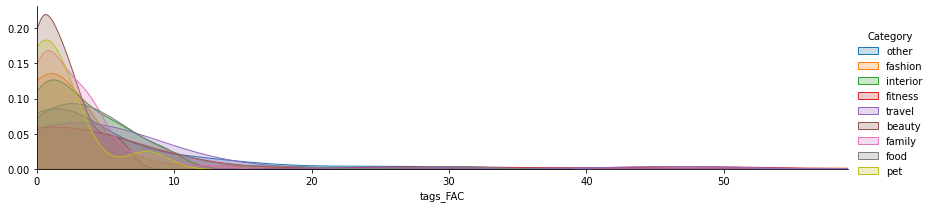

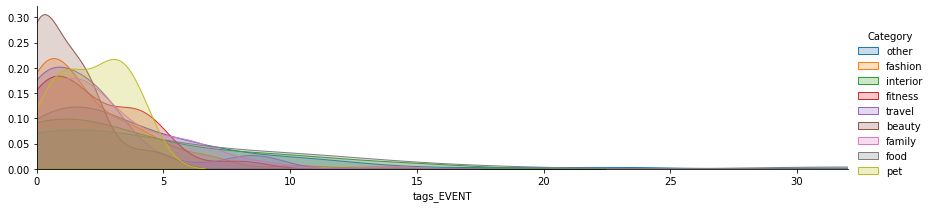

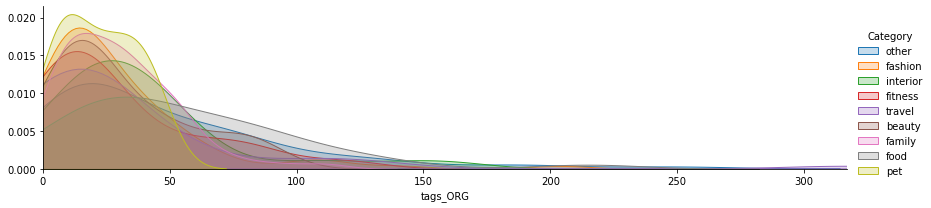

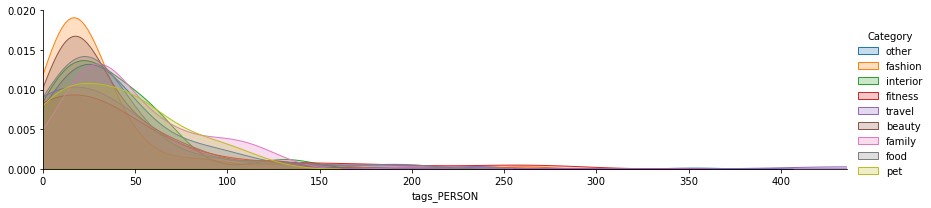

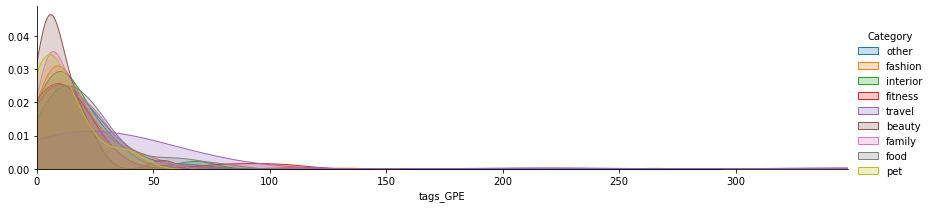

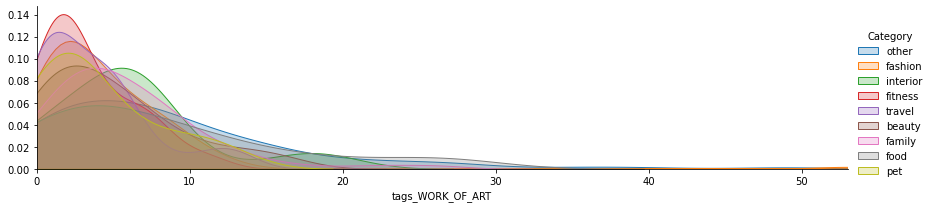

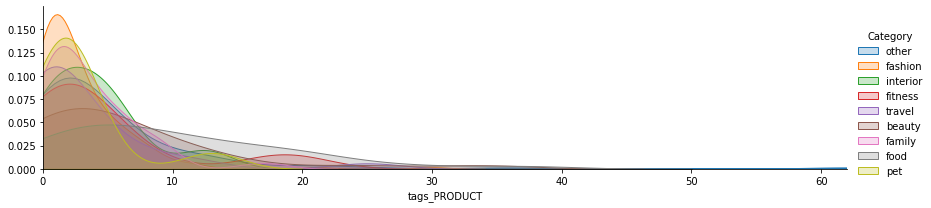

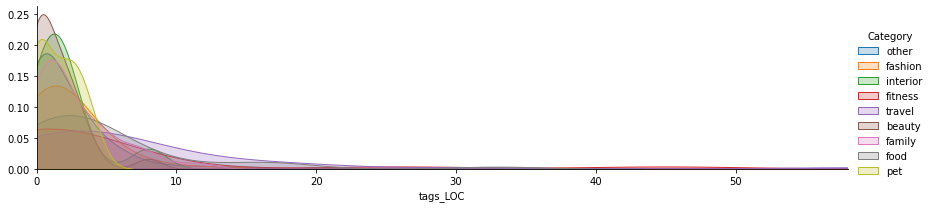

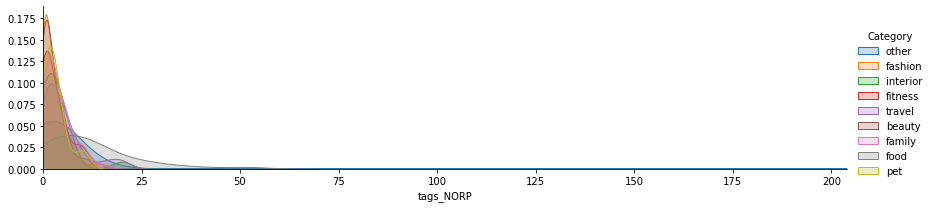

In [116]:
for x in df_captions.filter(regex=r'tags_[A-Z]', axis=1).columns:
    plot_distribution(df_captions, x, 'Category')